In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from helper_funcs import *

# Import data

## TO DO: Set the following local paths the Source Data excel files for Figure 4 and Extended Data Figure 5

In [2]:
SOURCE_DATA_FIG = "/Users/iboyle/Files/TargetDiscovery/PELO/PELO-dev/Source Data/Figure 4.xlsx"
SOURCE_DATA_EXT_FIG = "/Users/iboyle/Files/TargetDiscovery/PELO/PELO-dev/Source Data/Ext Figure 5.xlsx"

In [3]:
redownload = False
gene_effect = read_in_data("CRISPRGeneEffect", redownload=redownload, index_col=0)
cn = read_in_data("OmicsCNGene", redownload=redownload, index_col=0)
mod_prof = read_in_data("OmicsDefaultModelProfiles", redownload=redownload)
expr = read_in_data("OmicsExpressionProteinCodingGenesTPMLogp1", redownload=redownload, index_col=0)
model_meta = read_in_data("Model", redownload=redownload, index_col=0)

microsatellite_repeats = read_in_data("microsatellite_repeats", redownload=redownload, index_col=[0,1,2,3,4])

ccle_proteomics = read_in_data("ccle_proteomics")
ccle_proteomics = munge_ccle_proteomics(ccle_proteomics, model_meta)

Fetching local copy of CRISPRGeneEffect
Fetching local copy of OmicsCNGene
Fetching local copy of OmicsDefaultModelProfiles
Fetching local copy of OmicsExpressionProteinCodingGenesTPMLogp1
Fetching local copy of Model
Fetching local copy of microsatellite_repeats


# Prep Figure 4 Panels

## Panel A: SKIc Member Protein Levels

In [4]:
ttc37_loc = ("chr5", 95507014, "CCCTT", "11[A]", "GGTAT")
biomarkers = pd.concat([
    pd.Series("FOCAD Loss", cn["FOCAD (54914)"].loc[lambda x: x < 0.4].index),
    pd.Series("TTC37 Indel", microsatellite_repeats.loc[ttc37_loc].loc[lambda x: x <= 9].index),
])

biomarker_colors = biomarkers.reindex(list(set(expr.index)|set(ccle_proteomics.index))).fillna("_Other").rename("Biomarker")
biomarker_colors_order = ["_Other", "FOCAD Loss", "TTC37 Indel"]
biomarker_markers_order = ["o", "X", "s"]

In [5]:
fig4a_data = pd.concat({
    "FOCAD Protein Level":ccle_proteomics["FOCAD"],
    "TTC37 Protein Level":ccle_proteomics["TTC37"],
    "SKIV2L Protein Level":ccle_proteomics["SKIV2L"],
    "Biomarkers":biomarker_colors
}, axis=1, join="inner")
fig4a_data.shape, fig4a_data['Biomarkers'].value_counts()

((375, 4),
 _Other         335
 TTC37 Indel     23
 FOCAD Loss      17
 Name: Biomarkers, dtype: int64)

## Panel B: KP4 SKIV2L Viab

In [6]:
fig4b_data = pd.read_excel(SOURCE_DATA_FIG, sheet_name="Fig4b")

fig4b_viab = pd.DataFrame(
    fig4b_data.iloc[2:8, 1:5].values, index=fig4b_data.iloc[2:8, 0].rename("DOX"),
    columns=fig4b_data.iloc[1, 1:5].rename("gRNA")
).stack().to_frame("Relative Viability").reset_index()
fig4b_viab["Rep"] = fig4b_viab.groupby(["gRNA", "DOX"]).cumcount()

In [7]:
#get viability per replicate/gRNA in DOX+ vs - condition
dox_pos_reps = fig4b_viab.loc[
    fig4b_viab["DOX"] == "DOX+"
].set_index(["Rep", "gRNA"])["Relative Viability"]
dox_neg_reps = fig4b_viab.loc[
    fig4b_viab["DOX"] == "DOX-"
].set_index(["Rep", "gRNA"])["Relative Viability"]
#find difference between DOX- and + per replicate/gRNA
diffs = dox_neg_reps.subtract(dox_pos_reps).reset_index(level=0)

#test whether difference in viability between DOX- and + is greater for SKIV2L gDNAs then empty vector
fig4b_stats = ttest_vs_negcons(
    diffs.reset_index(), "gRNA", neg_cons=["Empty Vector"], to_test=["SKIV2L#1", "SKIV2L#2", "SKIV2L#5"],
    alternative="greater"
).to_frame("SKIV2L").T
fig4b_sig = to_scientific(fig4b_stats.loc["SKIV2L", "p-val"])
fig4b_stats

,statistic,p-val,Effect Size,n
SKIV2L,7.893871,0.000007,0.489192,12.0


## Panel C/D: RNAseq

### NOTE: these data are from "Analysis for RNAseq.ipynb"

In [8]:
fig4c_data = read_in_data("FOCAD_KO_DOXpos_vs_neg_deseq2", redownload=redownload)
fig4d_data = read_in_data("FOCAD_KO_DOXpos_vs_neg_gsea_prerank", index_col=0, low_memory=False, redownload=redownload)

Fetching local copy of FOCAD_KO_DOXpos_vs_neg_deseq2
Fetching local copy of FOCAD_KO_DOXpos_vs_neg_gsea_prerank


In [9]:
fig4d_enriched = fig4d_data.loc[
    :,fig4d_data.loc['fdr'] < 0.01
].T.reset_index().sort_values('nes', ascending=False)[['index', 'nes', 'fdr']]
fig4d_enriched["Name"] = fig4d_enriched['index'].replace(HALLMARK_ABBREV)\
    + " (" + fig4d_enriched["fdr"].apply(lambda x: to_scientific(x, prefix="$q$="))+")"
fig4d_enriched["Direction"] = np.where(fig4d_enriched['nes'] > 0, 'enriched', 'deenriched')
fig4d_enriched

Unnamed: 0,index,nes,fdr,Name,Direction
3,HALLMARK_UNFOLDED_PROTEIN_RESPONSE,1.963686,0.000000,UPR ($q$=0.00),enriched
0,HALLMARK_TNFA_SIGNALING_VIA_NFKB,1.736915,0.008322,TNFa via NFkB ($q$=0.008),enriched
2,HALLMARK_P53_PATHWAY,1.721641,0.008877,p53 ($q$=0.009),enriched
4,HALLMARK_MITOTIC_SPINDLE,-1.967252,0.001134,Mitotic Spindle ($q$=0.001),deenriched
5,HALLMARK_G2M_CHECKPOINT,-1.992627,0.000851,G2M ($q$=8.51x10$^{-04}$),deenriched
1,HALLMARK_E2F_TARGETS,-2.057821,0.000000,E2F ($q$=0.00),deenriched


## Panel E: UPR WB

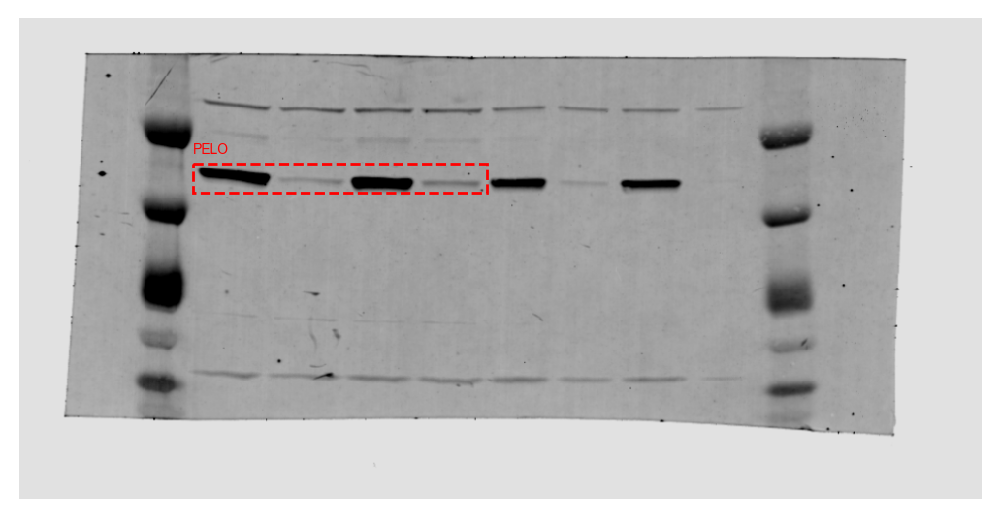

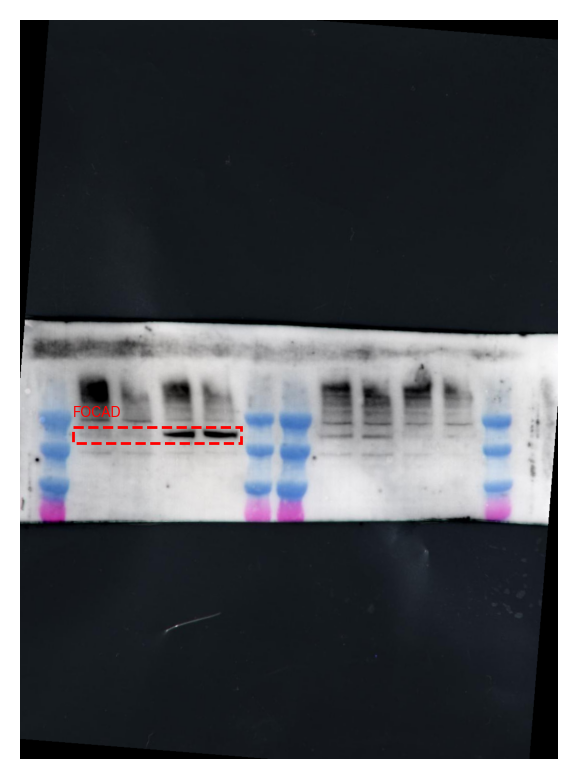

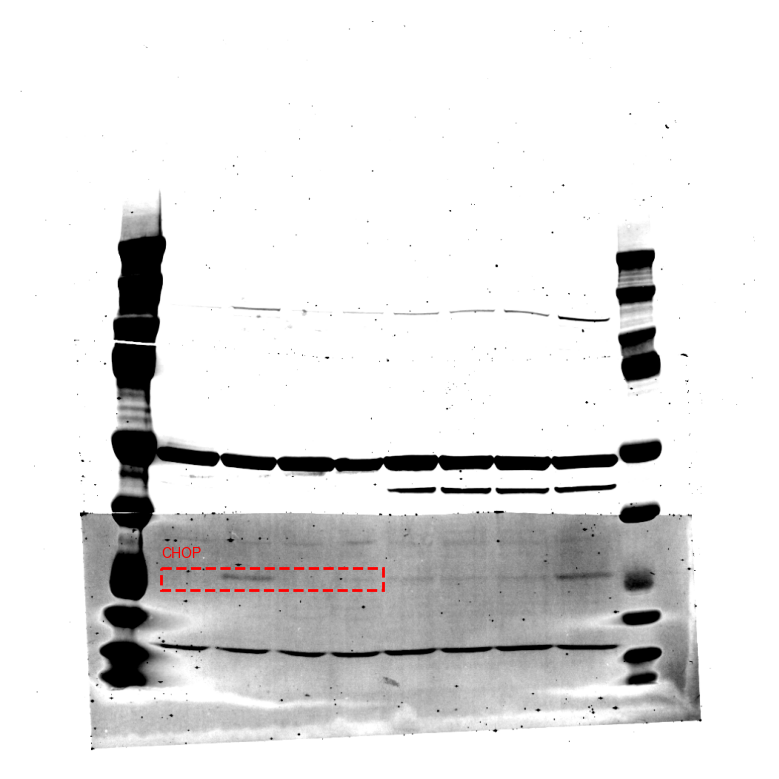

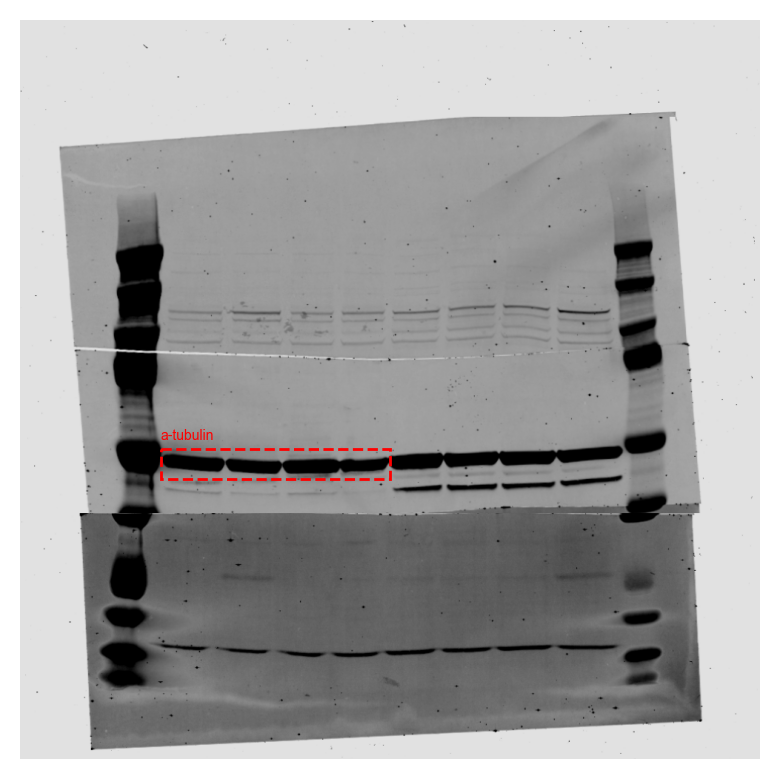

In [10]:
fig4e_PELO_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4e_PELO.tif', {"PELO":[150,180, 180,485]})
fig4e_FOCAD_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4e_FOCAD.tif', {"FOCAD":[775,805, 100,420]})
fig4e_CHOP_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4e_CHOP.tif', {"CHOP":[740,770, 190,490]})
fig4e_a_tubulin_cropped = crop_and_box_wb(
    IMG_FOLDER+'Figure 4/Fig4e_total_IRE1_a_tubulin.tif', {"a-tubulin":[580,620, 190,500]}
)

## Panel F: p38 and JNK on PELO KO

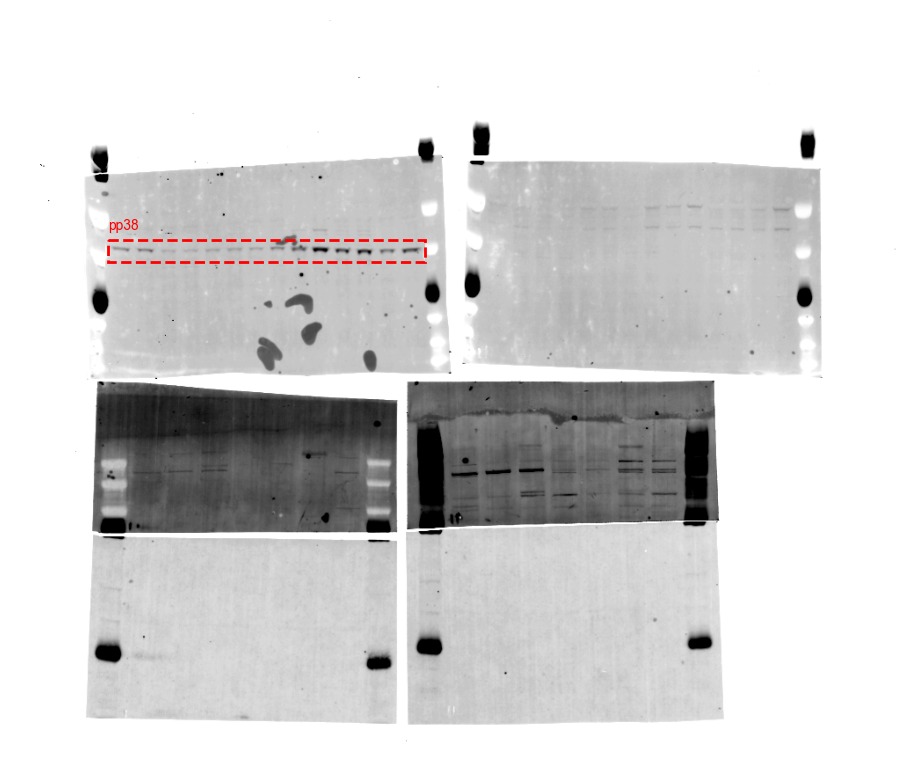

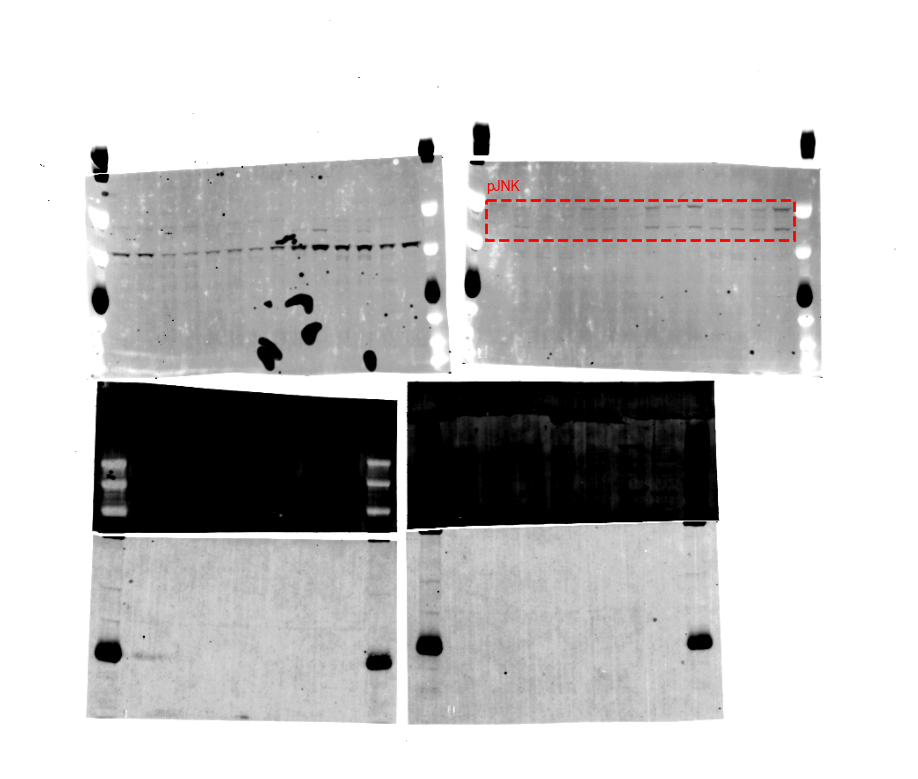

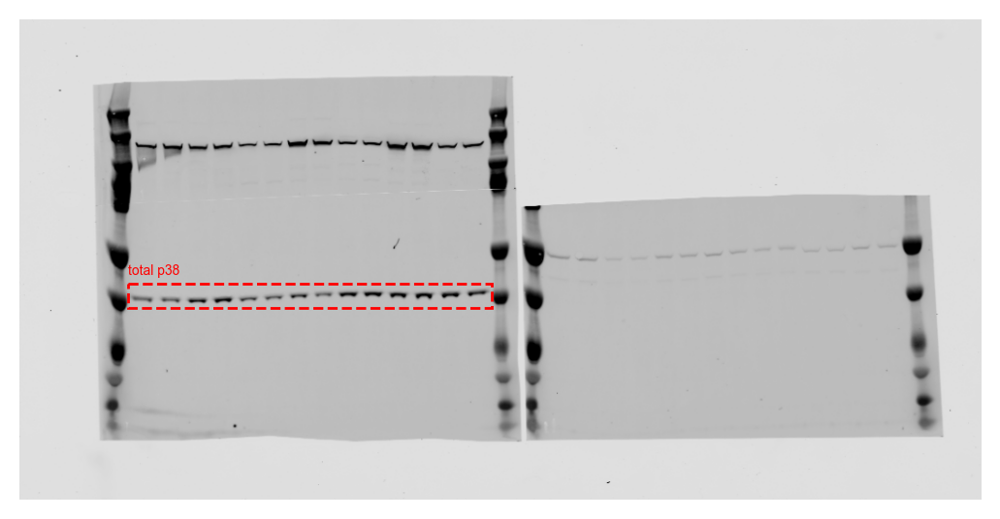

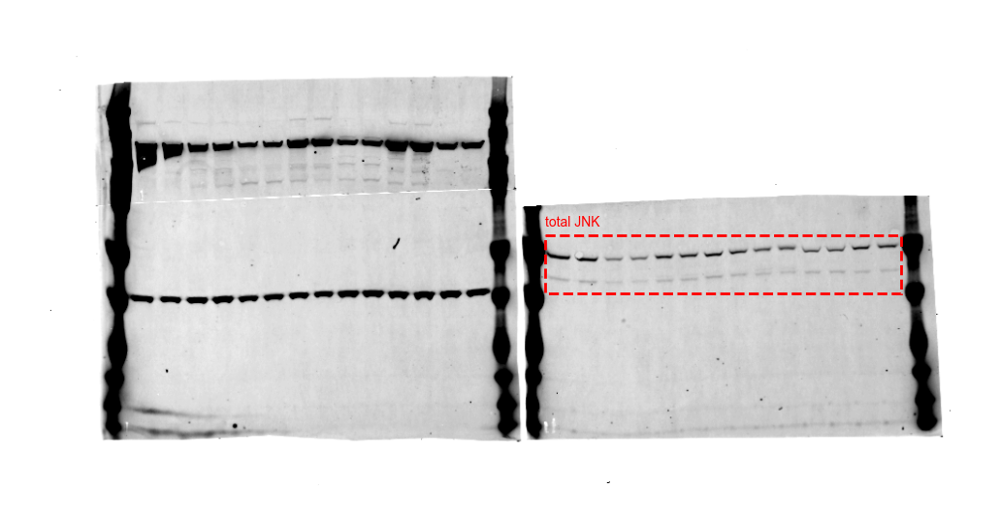

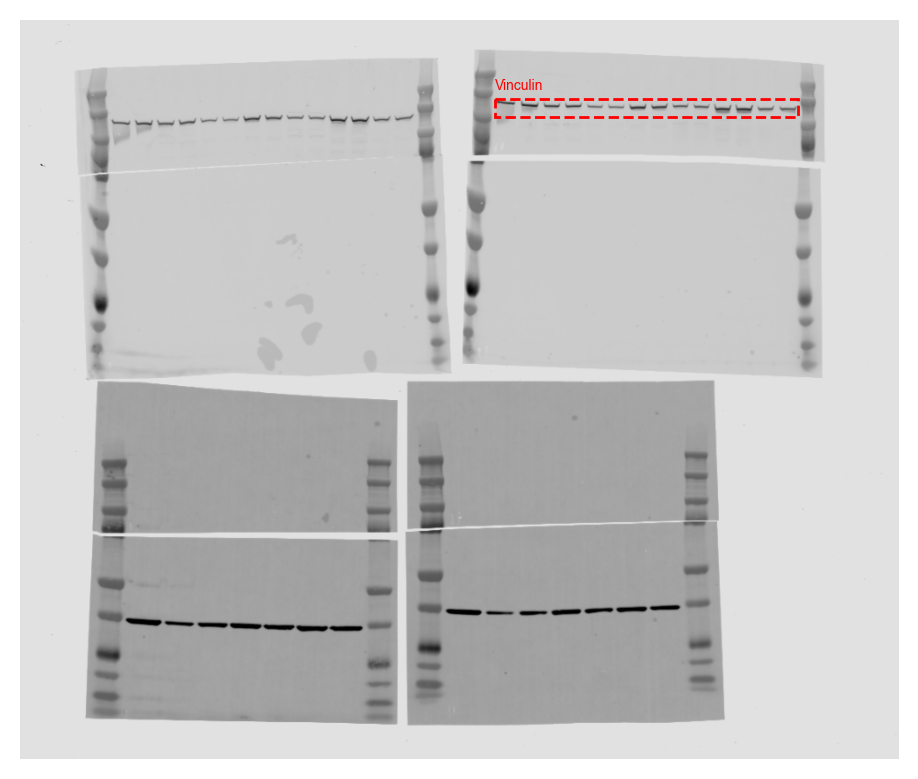

In [11]:
fig4f_pp38_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4f_pp38.tif', {"pp38":[250,275, 100,460]})
fig4f_pJNK_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4f_pJNK.tif', {"pJNK":[205,250, 530,880]})
fig4f_total_p38_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4f_total_p38.tif', {"total p38":[275,300, 112,490]})
fig4f_total_JNK_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4f_total_JNK.tif', {"total JNK":[225,285, 545,915]})
fig4f_Vinc_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4f_Vinculin.tif', {"Vinculin":[90,110, 540,885]})

## Panel G: p38 and JNK with ANS

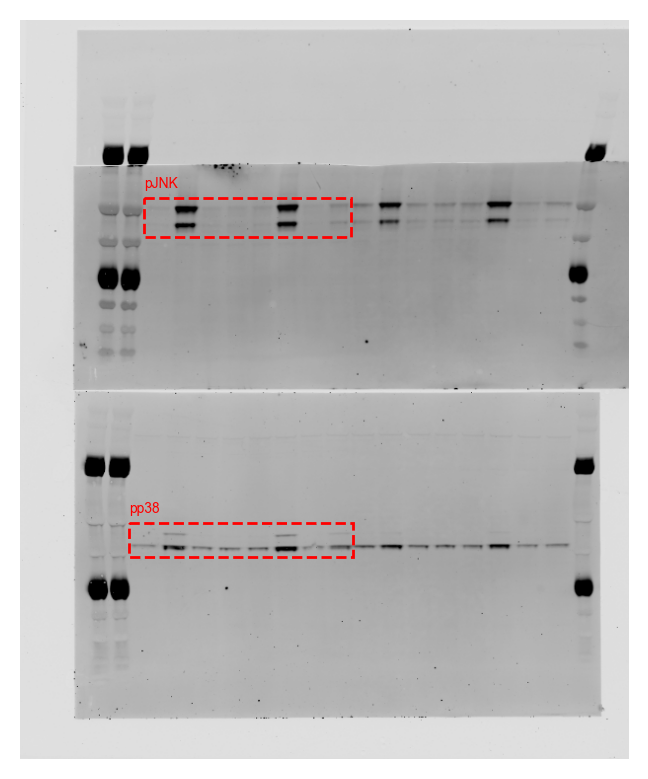

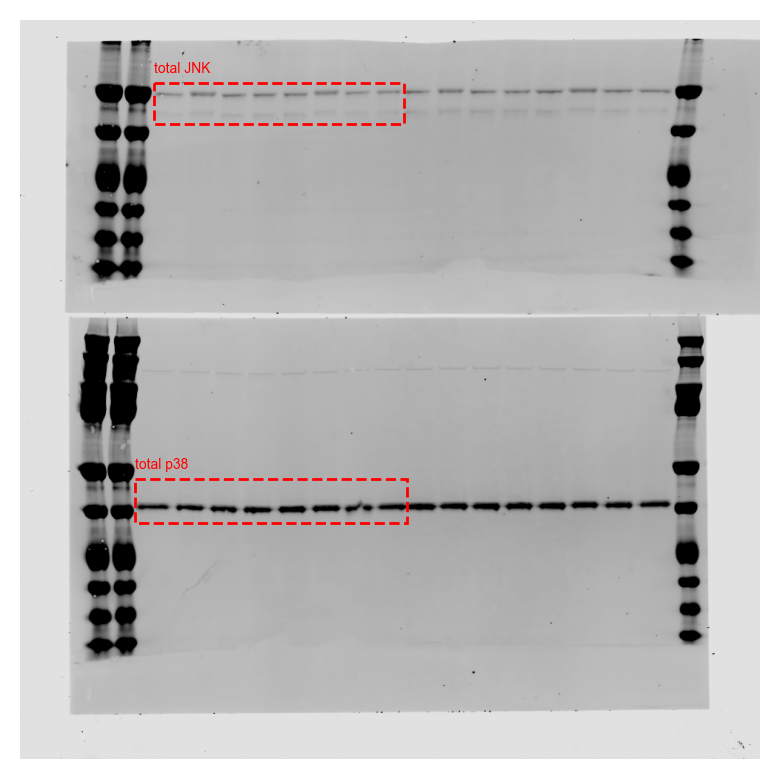

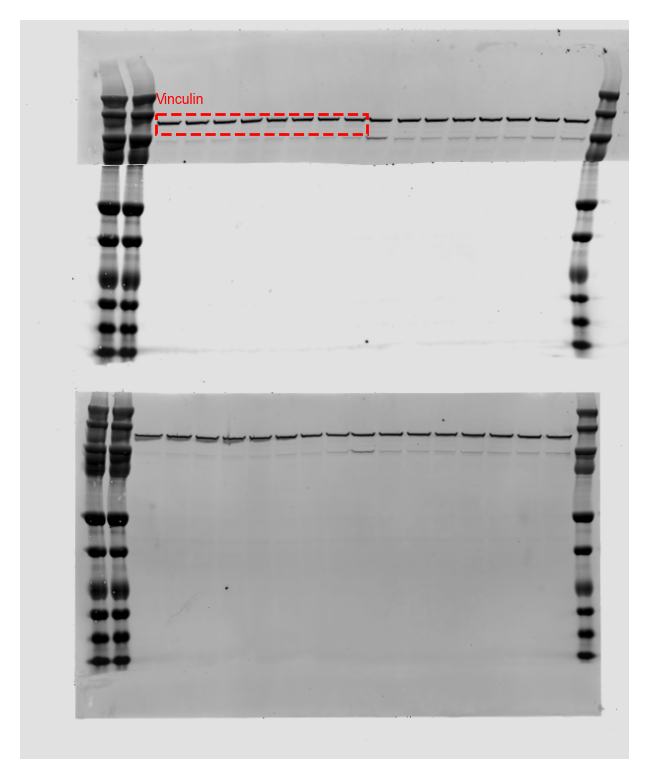

In [12]:
fig4g_pp38_pJNK_cropped = crop_and_box_wb(
    IMG_FOLDER+"Figure 4/Fig4g_pp38_pJNK.tif", {"pp38":[510,545, 110,337], "pJNK":[180,220, 125,335]}
)
fig4g_total_p38_JNK_cropped = crop_and_box_wb(
    IMG_FOLDER+"Figure 4/Fig4g_total_p38_JNK.tif", {"total p38":[620,680, 155,522], "total JNK":[85,140, 180,518]}
)
fig4g_Vinc_cropped = crop_and_box_wb(
    IMG_FOLDER+"Figure 4/Fig4g_Vinculin.tif", {"Vinculin":[95,115, 137,352]}
)

## Panel H: Mechanism

In [13]:
mechanism = np.asarray(Image.open('mechanism.png'))

# Construct Figure 4

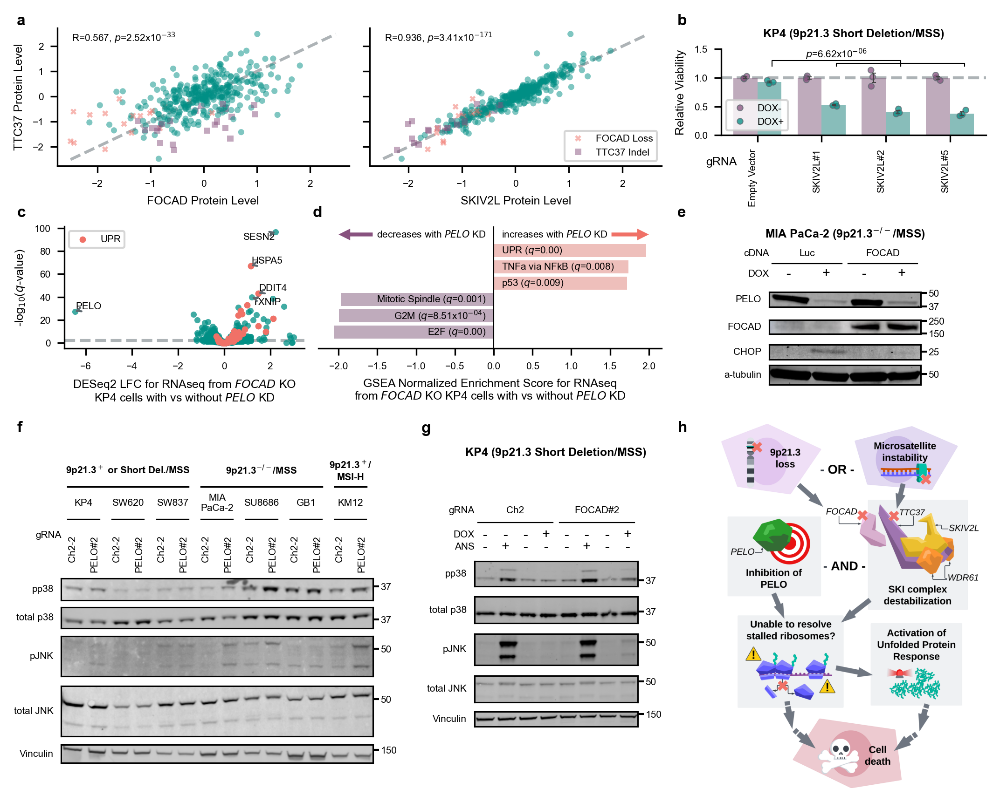

In [14]:
fig4 = plt.figure(layout="constrained", dpi=300, figsize=(DOUBLE_IN, 5.5))

gs = fig4.add_gridspec(nrows=6, ncols=3, width_ratios=[1.2,0.8,0.8], height_ratios=[0.1, 0.7, 0.1, 1.5, 0.1, 3])

As = gs[:2, :2].subgridspec(nrows=1, ncols=2)
A = fig4.add_subplot(As[0, 0])
quick_scatter(
    fig4a_data["FOCAD Protein Level"],
    fig4a_data["TTC37 Protein Level"], 
    hue=fig4a_data["Biomarkers"], style_hue=True,  markers=biomarker_markers_order,
    hue_order=biomarker_colors_order,
    linewidth=0, alpha=0.5, s=10, diagonal=True, ax=A
)
A.text(0.05, 0.9, pearson_str(fig4a_data["FOCAD Protein Level"], fig4a_data["TTC37 Protein Level"]), 
       transform=A.transAxes, fontsize=5)
A.legend().remove()
A1 = fig4.add_subplot(As[0, 1], sharey=A)
quick_scatter(
    fig4a_data["SKIV2L Protein Level"],
    fig4a_data["TTC37 Protein Level"],  
    hue=fig4a_data["Biomarkers"], style_hue=True,  markers=biomarker_markers_order,
    hue_order=biomarker_colors_order,
    linewidth=0, alpha=0.5, s=10, diagonal=True, ax=A1
)
A1.text(0.05, 0.9, pearson_str(fig4a_data["SKIV2L Protein Level"], fig4a_data["TTC37 Protein Level"]), 
        transform=A1.transAxes, fontsize=5)
A1.legend(loc="lower right")
A1.label_outer()

B = fig4.add_subplot(gs[0,2])
B.set_axis_off()
B.annotate(
    "KP4 (9p21.3 Short Deletion/MSS)", (0.5,0.5), 
    horizontalalignment='center', verticalalignment='center', 
    weight="bold", fontsize=6
)
B1 = fig4.add_subplot(gs[1, 2])
fancybar(
    data=fig4b_viab,
    x="gRNA", y="Relative Viability", hue="DOX", 
    hue_order=["DOX-", "DOX+"], palette=[NEG_CON, PELO_GUIDES[1]],
    dodge=True, s=3, ax=B1
)
add_bracket(B1, fig4b_sig, [["Empty Vector"], ["SKIV2L#1", "SKIV2L#2", "SKIV2L#5"]], 1.3)
B1.set_ylim(0,1.5)
B1.xaxis.set_label_coords(0, -0.25)
B1.set_xticks(B1.get_xticks())
B1.set_xticklabels(labels=B1.get_xticklabels(), rotation=90, ha="right")
axline(B1, "h", 1)
B1.legend(title=None, loc="lower left")

CDs = gs[3,:2].subgridspec(nrows=1, ncols=2, width_ratios=[0.7, 1])
C = fig4.add_subplot(CDs[0])
quick_scatter(
    x=fig4c_data["log2FoldChange"], y=fig4c_data["-log10(padj)"],
    labels=pd.concat([
        fig4c_data.loc[fig4c_data["padj"] < 0.01].nsmallest(4, "padj")["symbol"],
        fig4c_data.loc[fig4c_data["symbol"] =="PELO", "symbol"]
    ]), 
    hline=-np.log10(0.01), s=10, linewidth=0, alpha=0.75, ax=C
)
sns.scatterplot(
    x=fig4c_data.loc[fig4c_data["UPR"], "log2FoldChange"], y=fig4c_data["-log10(padj)"], 
    ax=C, label="UPR", s=11, linewidth=0, alpha=1
)
C.set_xlabel("DESeq2 LFC for RNAseq from $FOCAD$ KO\nKP4 cells with vs without $PELO$ KD")
C.set_ylabel("-log$_{10}$($q$-value)")

D = fig4.add_subplot(CDs[1])
sns.barplot(
    data=fig4d_enriched, x='nes', y='index', hue='Direction', 
    palette=[POS_CON, NEG_CON], alpha=0.5, ax=D
)
for idx, row in fig4d_enriched.set_index("index").iterrows():
    if row["Direction"] == "enriched":
        D.text(0.1, idx, row['Name'], rotation=0, va="center", ha="left", fontsize=5)
    else:
        D.text(-0.1, idx, row['Name'], rotation=0, va="center", ha="right", fontsize=5)
D.set_yticklabels("")
D.legend().remove()
D.annotate(
    'increases with $PELO$ KD', xy=(2, -1), xycoords='data', 
    xytext=(0.1, -1), va='center', ha='left', annotation_clip=False,
    arrowprops=dict(facecolor=POS_CON, linewidth=0, headlength=6, headwidth=6, width=2)
)
D.annotate(
    'decreases with $PELO$ KD', xy=(-2, -1), xycoords='data', 
    xytext=(-0.1, -1), va='center', ha='right', annotation_clip=False,
    arrowprops=dict(facecolor=NEG_CON, linewidth=0, headlength=6, headwidth=6, width=2)
)
D.set_ylim(6, -1.5)
D.set_ylabel(None)
D.spines['left'].set_visible(False)
D.get_yaxis().set_visible(False)
D.axvline(0, color='k', linewidth=0.5)
D.set_xlabel("GSEA Normalized Enrichment Score for RNAseq\nfrom $FOCAD$ KO KP4 cells with vs without $PELO$ KD")

E_ratios = get_wb_height_ratios([
    fig4e_PELO_cropped["PELO"], fig4e_FOCAD_cropped["FOCAD"],
    fig4e_CHOP_cropped["CHOP"], fig4e_a_tubulin_cropped["a-tubulin"]
])
Es = gs[3, 2].subgridspec(nrows=7, ncols=2, width_ratios=[0.1,1], height_ratios=[1]+E_ratios+[1])
EE = fig4.add_subplot(Es[0,1])
EE.annotate(
    r"MIA PaCa-2 (9p21.3$^{-/-}$/MSS)", (0.5,0.5), 
    horizontalalignment='center', verticalalignment='center', 
    weight="bold", fontsize=6
)
EE.set_axis_off()
EL = fig4.add_subplot(Es[1,1])
add_wb_labels(
    EL, [("cDNA", ["Luc", "FOCAD"]), ("_", ["_", "_"]), ("DOX",["-","+","-","+"])]
)
E1 = fig4.add_subplot(Es[2,1])
wb_image(E1, "PELO", fig4e_PELO_cropped["PELO"], ladder={"50":0.95,"37":0.05})
E2 = fig4.add_subplot(Es[3,1])
wb_image(E2, "FOCAD", fig4e_FOCAD_cropped["FOCAD"], ladder={"250":0.95,"150":0.05})
E3 = fig4.add_subplot(Es[4,1])
wb_image(E3, "CHOP", fig4e_CHOP_cropped["CHOP"], ladder={"25":0.55})
E4 = fig4.add_subplot(Es[5,1])
wb_image(E4, "a-tubulin", fig4e_a_tubulin_cropped["a-tubulin"], ladder={"50":0.55})

F_LABEL = (1.3,5)
F_ratios = get_wb_height_ratios([
    fig4f_pp38_cropped["pp38"], fig4f_total_p38_cropped["total p38"], 
    fig4f_pJNK_cropped["pJNK"], fig4f_total_JNK_cropped['total JNK'], fig4f_Vinc_cropped['Vinculin']
], F_LABEL)
Fs = gs[5, 0].subgridspec(nrows=8, ncols=1, height_ratios=[0.5]+F_ratios+[0.5])
FL = fig4.add_subplot(Fs[1])
add_wb_labels(
    FL, [("", ["KP4", "SW620", "SW837", "MIA\nPaCa-2", "SU8686", "GB1", "KM12"]),
         ("_", ["_", "_", "_", "_", "_", "_", "_"]),
         ("gRNA", ["Ch2-2", "PELO#2","Ch2-2", "PELO#2",
                   "Ch2-2", "PELO#2","Ch2-2", "PELO#2",
                   "Ch2-2", "PELO#2","Ch2-2", "PELO#2","Ch2-2", "PELO#2"])],
    groups=[
        (r'9p21.3$^+$ or Short Del./MSS', (0, 0.428)), 
        (r'9p21.3$^{-/-}$/MSS', (0.428,0.857)), (r'9p21.3$^+$/''\nMSI-H', (0.857,1))
    ], 
    level_params={"gRNA":dict(fontsize=5, ha="center", va="top", rotation=90)},
    size=F_LABEL
)
F1 = fig4.add_subplot(Fs[2])
wb_image(F1, "pp38", fig4f_pp38_cropped["pp38"], ladder={"37":0.65})
F2 = fig4.add_subplot(Fs[3])
wb_image(F2, "total p38", fig4f_total_p38_cropped["total p38"], ladder={"37":0.45})
F3 = fig4.add_subplot(Fs[4])
wb_image(F3, "pJNK", fig4f_pJNK_cropped["pJNK"], ladder={"50":0.7})
F4 = fig4.add_subplot(Fs[5])
wb_image(F4, "total JNK", fig4f_total_JNK_cropped["total JNK"], ladder={"50":0.75})
F5 = fig4.add_subplot(Fs[6])
wb_image(F5, "Vinculin", fig4f_Vinc_cropped["Vinculin"], ladder={"150":0.75})

G_LABEL = (1.5,5)
G_ratios = get_wb_height_ratios([
    fig4g_pp38_pJNK_cropped['pp38'], fig4g_total_p38_JNK_cropped['total p38'], 
    fig4g_pp38_pJNK_cropped['pJNK'], fig4g_total_p38_JNK_cropped['total JNK'], 
    fig4g_Vinc_cropped["Vinculin"]
], G_LABEL)
Gs = gs[5, 1].subgridspec(nrows=8, ncols=2, width_ratios=[0.1,1], height_ratios=[2]+G_ratios+[2])
GG = fig4.add_subplot(Gs[0,1])
GG.annotate(
    "KP4 (9p21.3 Short Deletion/MSS)", (0.5,0.5), 
    horizontalalignment='center', verticalalignment='center', 
    weight="bold", fontsize=6
)
GG.set_axis_off()
GL = fig4.add_subplot(Gs[1,1])
add_wb_labels(
    GL, [("gRNA",["Ch2", "FOCAD#2"]), ("_",["_", "_"]), 
         ("DOX",["-", "-", "-", "+","-", "-", "-", "+"]),
         ("ANS", ["-", "+", "-", "-","-", "+", "-", "-"])],
    level_params={"DOX":dict(fontsize=7, ha="center", va="center"), 
                  "ANS":dict(fontsize=7, ha="center", va="center")}, 
    size=G_LABEL
)
G1 = fig4.add_subplot(Gs[2,1])
wb_image(G1, "pp38", fig4g_pp38_pJNK_cropped["pp38"], ladder={"37":0.25})
G2 = fig4.add_subplot(Gs[3,1])
wb_image(G2, "total p38", fig4g_total_p38_JNK_cropped["total p38"], ladder={"37":0.45})
G3 = fig4.add_subplot(Gs[4,1])
wb_image(G3, "pJNK", fig4g_pp38_pJNK_cropped["pJNK"], ladder={"50":0.75})
G4 = fig4.add_subplot(Gs[5,1])
wb_image(G4, "total JNK", fig4g_total_p38_JNK_cropped["total JNK"], ladder={"50":0.8})
G5 = fig4.add_subplot(Gs[6,1])
wb_image(G5, "Vinculin", fig4g_Vinc_cropped["Vinculin"], ladder={"150":0.85})

H = fig4.add_subplot(gs[5, 2])
H.imshow(mechanism)
H.set_axis_off()

fig4.text(0.01, 1, "a", weight='bold', fontsize=8)
fig4.text(0.68, 1, "b", weight='bold', fontsize=8)
fig4.text(0.01, 0.75, "c", weight='bold', fontsize=8)
fig4.text(0.31, 0.75, "d", weight='bold', fontsize=8)
fig4.text(0.68, 0.75, "e", weight='bold', fontsize=8)
fig4.text(0.01, 0.47, "f", weight='bold', fontsize=8)
fig4.text(0.42, 0.47, "g", weight='bold', fontsize=8)
fig4.text(0.68, 0.47, "h", weight='bold', fontsize=8)

fig4.set_constrained_layout_pads(
    w_pad = 0.05, h_pad = 0.02
)

plt.savefig("figures/Fig4.pdf", transparent=True, bbox_inches='tight',)
plt.savefig("figures/Fig4.jpg", transparent=True, bbox_inches='tight',)

# Prep Extended Data Figure 4 Panels

## Extended Data Panel A/B: Protein vs Expr

In [15]:
ski_expr = expr.loc[:, expr.columns.str.split(" ").str[0].isin(["FOCAD", "SKIV2L", "TTC37", "WDR61"])]
ski_expr.columns = ski_expr.columns.str.split(" ").str[0]+" Expression"
extfig4a_data = pd.concat([
    ccle_proteomics[["FOCAD", "SKIV2L", "TTC37", "WDR61"]].add_suffix(" Protein Level"),
    ski_expr,
    biomarker_colors.rename("Biomarkers")
], axis=1, join="outer")
extfig4a_data.shape[0]

1485

In [16]:
extfig4b_data = pd.concat([
    ccle_proteomics[["FOCAD"]].add_suffix(" Protein Level"),
    ski_expr[["SKIV2L Expression", "TTC37 Expression"]],
    biomarker_colors.rename("Biomarkers")
], axis=1, join="inner")
extfig4b_data.shape[0]

369

## Extended Data Panel B: WB

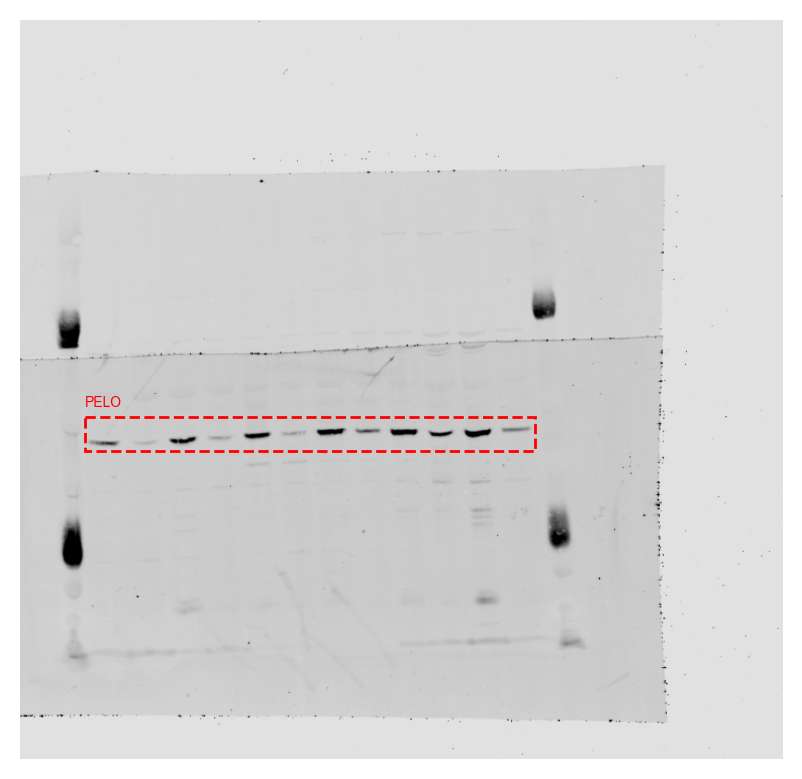

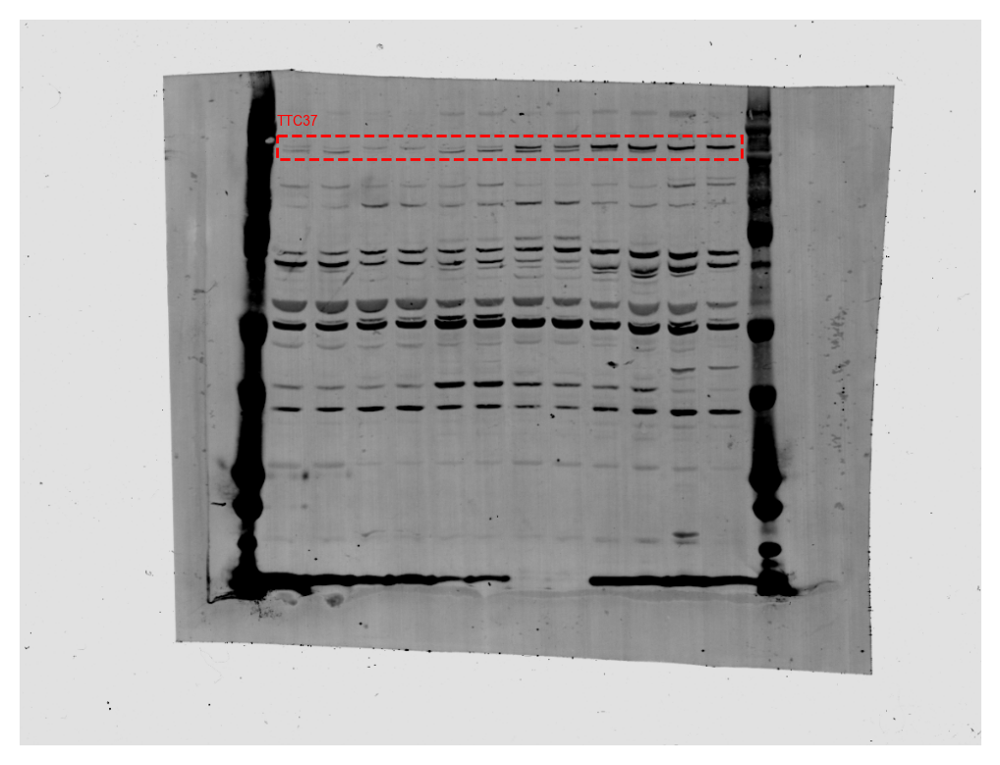

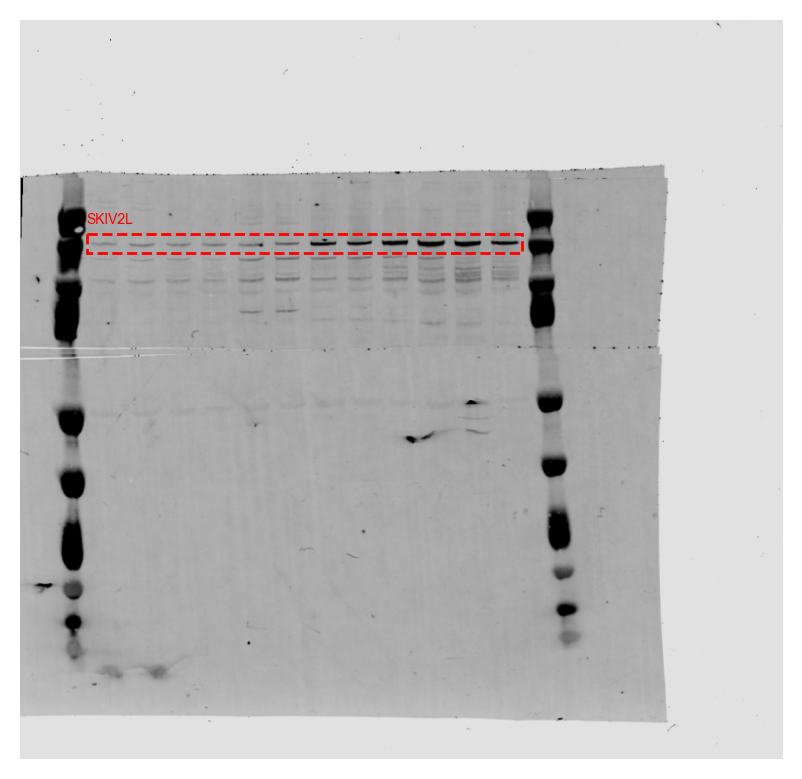

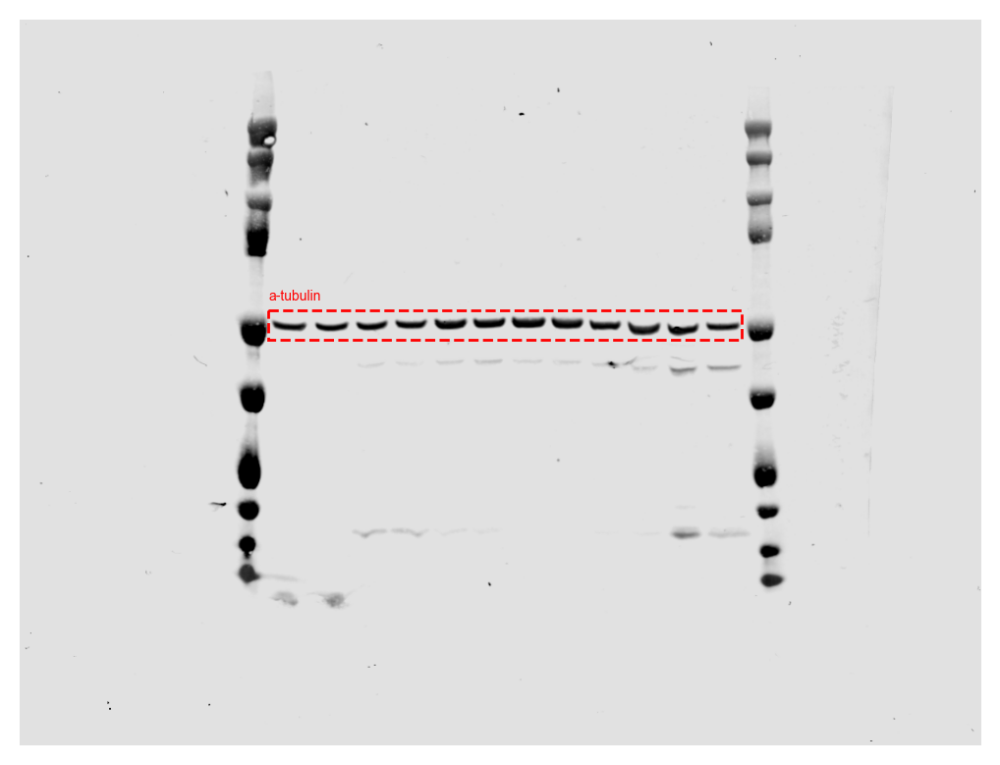

In [17]:
extfig4c_PELO_cropped = crop_and_box_wb(
    IMG_FOLDER+"Extended Figure 4/ExtFig4b_PELO.tif", {"PELO":[520,565, 85,675]}
)
extfig4c_TTC37_cropped = crop_and_box_wb(
    IMG_FOLDER+"Extended Figure 4/ExtFig4b_TTC37.tif", {"TTC37":[120,145, 267,750]}
)
extfig4c_SKIV2L_cropped = crop_and_box_wb(
    IMG_FOLDER+"Extended Figure 4/ExtFig4b_SKIV2L.tif", {"SKIV2L":[280,305, 87,657]}
)
extfig4c_a_tubulin_cropped = crop_and_box_wb(
    IMG_FOLDER+"Extended Figure 4/ExtFig4b_a_tubulin.tif", {"a-tubulin":[302,333, 258,750]}
)

## Extended Data Panel C: WB

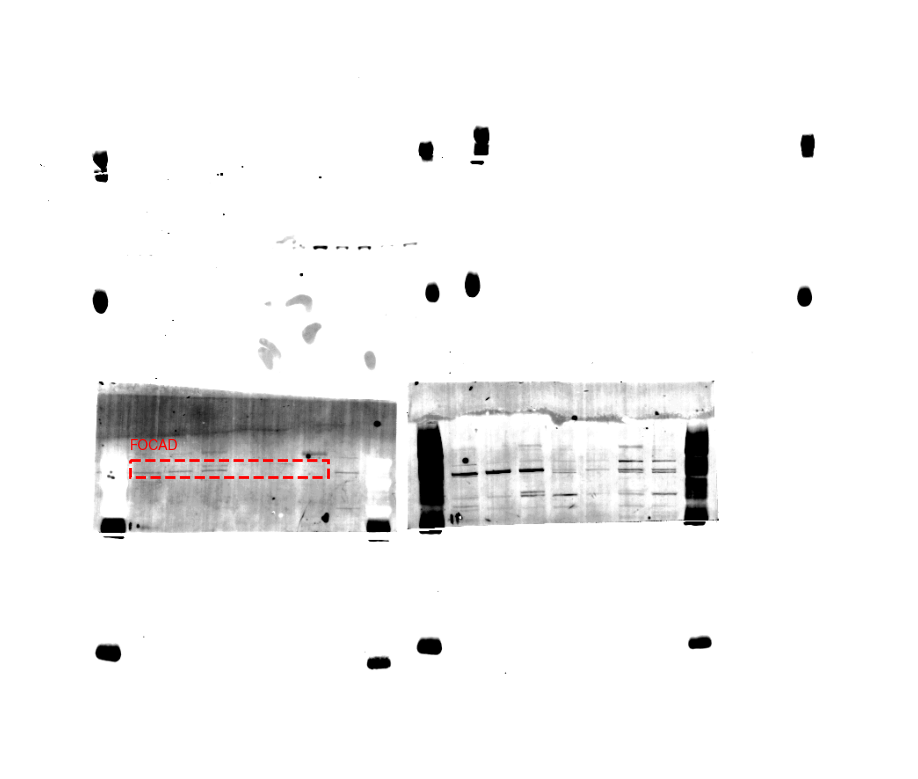

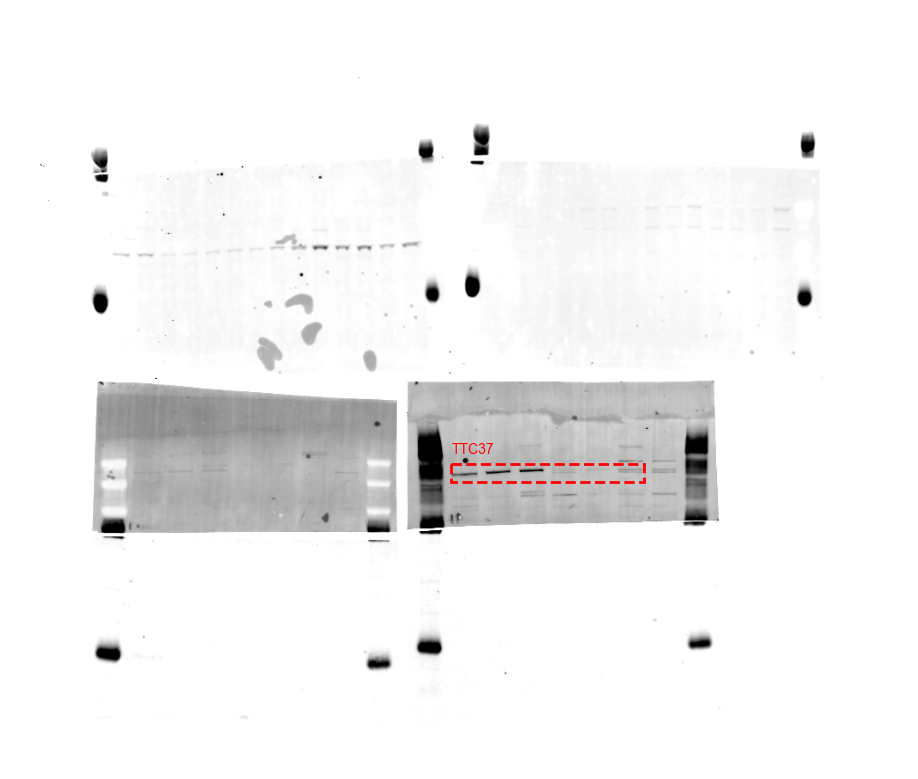

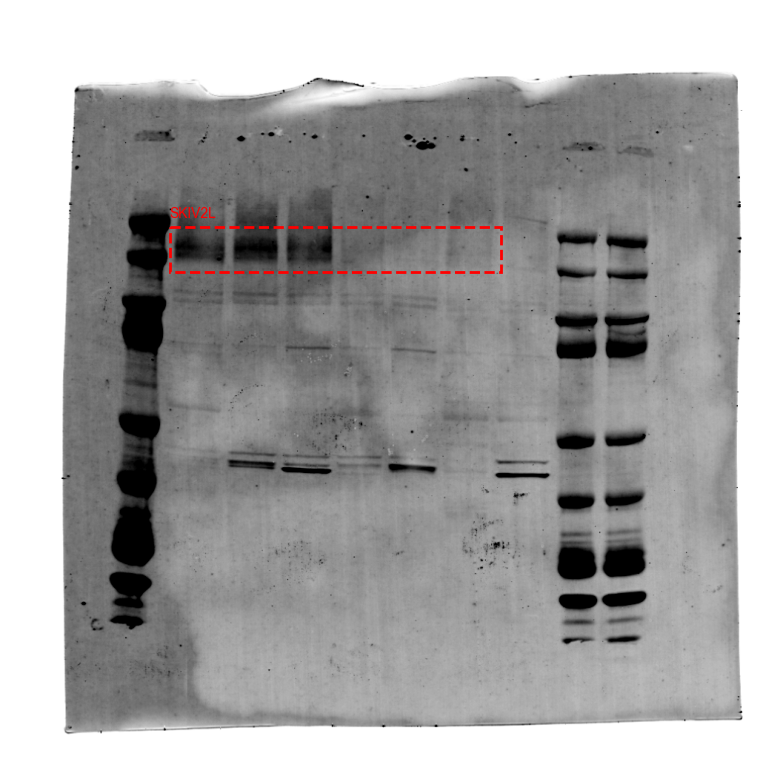

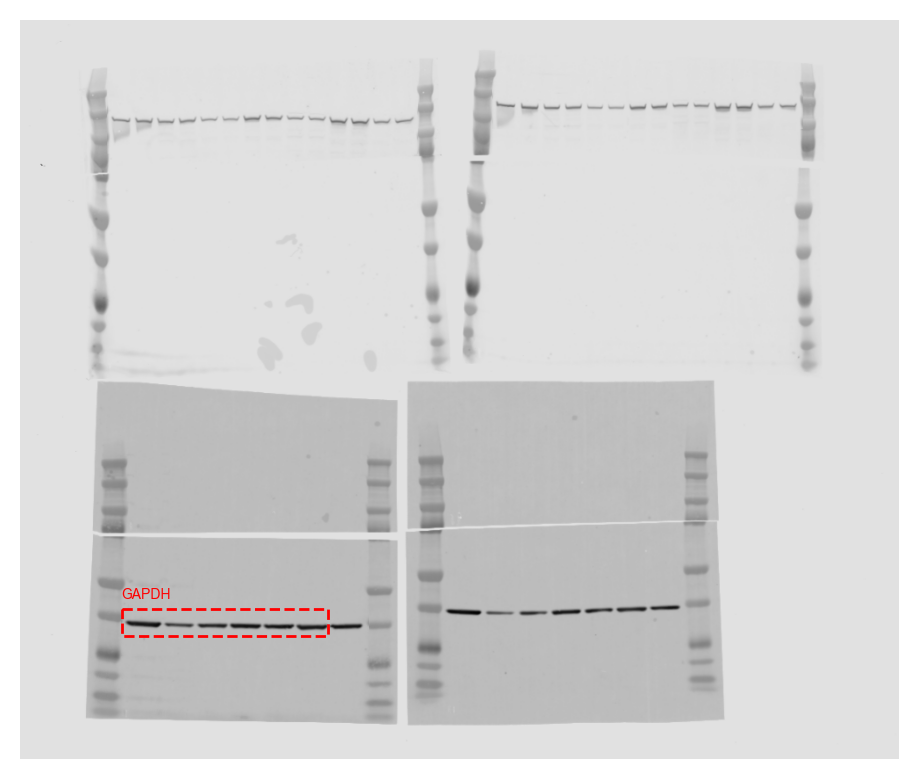

In [18]:
extfig4d_FOCAD_cropped = crop_and_box_wb(
    IMG_FOLDER+"Extended Figure 4/ExtFig4c_FOCAD_new.tif", {"FOCAD":[500,520, 125,350]}
)
extfig4d_TTC37_cropped = crop_and_box_wb(
    IMG_FOLDER+"Extended Figure 4/ExtFig4c_FOCAD_TTC37.tif", {"TTC37":[505,525, 490,710]}
)
extfig4d_SKIV2L_cropped = crop_and_box_wb(
    IMG_FOLDER+"Extended Figure 4/ExtFig4c_SKIV2L.tif", {"SKIV2L":[280,340, 202,650]}
)
extfig4d_GAPDH_cropped = crop_and_box_wb(
    IMG_FOLDER+"Extended Figure 4/ExtFig4c_GAPDH_old.tif", {"GAPDH":[670,700, 115,350]}
)

# Construct Extended Data Figure 4

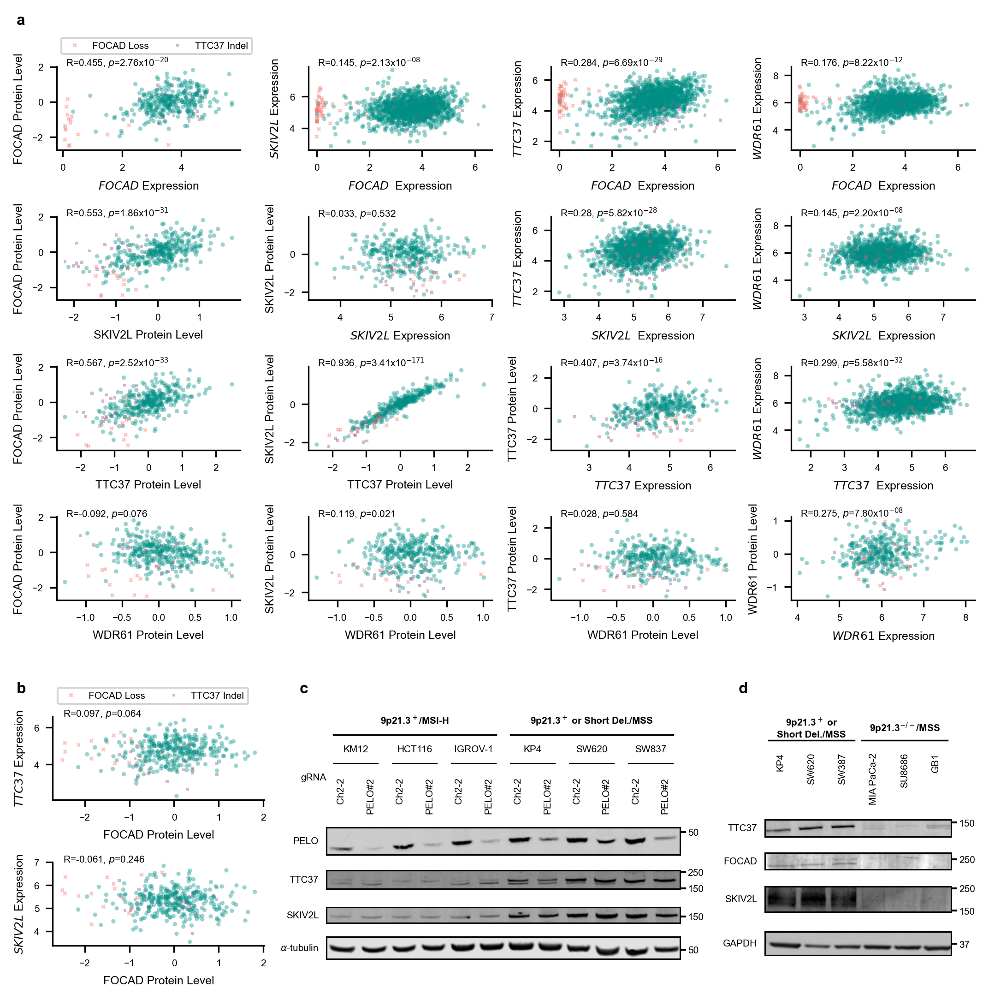

In [19]:
extfig4 = plt.figure(layout="constrained", dpi=300, figsize=(DOUBLE_IN, 7))

gs = extfig4.add_gridspec(nrows=6, ncols=3, width_ratios=[0.3, 0.5, 0.3], height_ratios=[0.01,0.33,0.33,0.33,0.05, 0.5])

As = gs[1:4, :].subgridspec(nrows=4, ncols=4)
for i, gene1 in enumerate(["FOCAD", "SKIV2L", "TTC37", "WDR61"]):
    for j, gene2 in enumerate(["FOCAD", "SKIV2L", "TTC37", "WDR61"]):
        ax = extfig4.add_subplot(As[i, j])
        if i == j:
            x, y = gene2+" Expression", gene1+" Protein Level"
            x_label, y_label = f"${gene2}$ Expression", gene1+" Protein Level"
        elif i > j:
            x, y = gene1+" Protein Level", gene2+" Protein Level"
            x_label, y_label = gene1+" Protein Level", gene2+" Protein Level"
        elif i < j:
            x, y = gene1+" Expression", gene2+" Expression"
            x_label, y_label = f"${gene1}$  Expression", f"${gene2}$ Expression"
        quick_scatter(
            x=extfig4a_data[x].rename(x_label), y=extfig4a_data[y].rename(y_label), 
            ax=ax, s=5, alpha=0.4, linewidth=0, style_hue=True,
            hue=extfig4a_data["Biomarkers"], hue_order=biomarker_colors_order, 
            style_order=biomarker_markers_order
        )
        if i == 0 and j == 0:
            ax.legend(loc="upper left", bbox_to_anchor=(0, 1.4), ncols=2)
        else:
            ax.legend().remove()
        corr = pearson_str(extfig4a_data[x].dropna(), extfig4a_data[y].dropna())
        ax.text(0.05, 1.0, corr, transform=ax.transAxes, ha="left")

Bs = gs[5, 0].subgridspec(nrows=2, ncols=1)
B1 = extfig4.add_subplot(Bs[0])
quick_scatter(
    x=extfig4b_data["FOCAD Protein Level"], y=extfig4b_data["TTC37 Expression"], 
    ax=B1, s=5, alpha=0.4, linewidth=0, style_hue=True,
    hue=extfig4b_data["Biomarkers"], hue_order=biomarker_colors_order, style_order=biomarker_markers_order
)
B1.legend(loc="upper left", bbox_to_anchor=(0, 1.4), ncols=2)
B1.text(
    0.05, 1.0, 
    pearson_str(extfig4b_data["FOCAD Protein Level"], extfig4b_data["TTC37 Expression"]), 
    transform=B1.transAxes, ha="left"
)
B1.set_ylabel("$TTC37$ Expression")
B2 = extfig4.add_subplot(Bs[1])
quick_scatter(
    x=extfig4b_data["FOCAD Protein Level"], y=extfig4b_data["SKIV2L Expression"], 
    ax=B2, s=5, alpha=0.4, linewidth=0, style_hue=True,
    hue=extfig4b_data["Biomarkers"], hue_order=biomarker_colors_order, style_order=biomarker_markers_order
)
B2.legend().remove()
B2.text(
    0.05, 1.0, 
    pearson_str(extfig4b_data["FOCAD Protein Level"], extfig4b_data["SKIV2L Expression"]), 
    transform=B2.transAxes, ha="left"
)
B2.set_ylabel("$SKIV2L$ Expression")

C_ratios = get_wb_height_ratios([
    extfig4c_PELO_cropped["PELO"], extfig4c_TTC37_cropped["TTC37"],
    extfig4c_SKIV2L_cropped["SKIV2L"], extfig4c_a_tubulin_cropped["a-tubulin"],
])
Cs = gs[5, 1].subgridspec(nrows=7, ncols=1, height_ratios=[1]+C_ratios+[1])
CL = extfig4.add_subplot(Cs[1])
add_wb_labels(
    CL, [("",["KM12", "HCT116", "IGROV-1", "KP4", "SW620", "SW837"]), 
         ("_",["_", "_", "_", "_", "_", "_"]), 
         ("gRNA",["Ch2-2", "PELO#2", "Ch2-2", "PELO#2","Ch2-2", "PELO#2",
                  "Ch2-2", "PELO#2","Ch2-2", "PELO#2","Ch2-2", "PELO#2"])],
    groups=[(r'9p21.3$^+$/MSI-H',(0,0.5)), (r'9p21.3$^+$ or Short Del./MSS', (0.5,1))],
    level_params={"gRNA":dict(fontsize=5, ha="center", va="top", rotation=90)}
)
C1 = extfig4.add_subplot(Cs[2])
wb_image(C1, "PELO", extfig4c_PELO_cropped["PELO"], ladder={"50":0.85})
C2 = extfig4.add_subplot(Cs[3])
wb_image(C2, "TTC37", extfig4c_TTC37_cropped["TTC37"], ladder={"250":0.95, "150":0.05})
C3 = extfig4.add_subplot(Cs[4])
wb_image(C3, "SKIV2L", extfig4c_SKIV2L_cropped["SKIV2L"], ladder={"150":0.45})
C4 = extfig4.add_subplot(Cs[5])
wb_image(C4, r"$\alpha$-tubulin", extfig4c_a_tubulin_cropped['a-tubulin'], ladder={"50":0.45})


D_ratios = get_wb_height_ratios([
    extfig4d_TTC37_cropped["TTC37"], extfig4d_FOCAD_cropped["FOCAD"], 
    extfig4d_SKIV2L_cropped["SKIV2L"], extfig4d_GAPDH_cropped["GAPDH"]
])
Ds = gs[5, 2].subgridspec(nrows=7, ncols=1, height_ratios=[1]+D_ratios+[1])
DL = extfig4.add_subplot(Ds[1])
add_wb_labels(
    DL, [("",["KP4", "SW620", "SW387", "MIA PaCa-2", "SU8686", "GB1"])],
    groups=[(r'9p21.3$^+$ or''\nShort Del./MSS',(0,0.5)), (r'9p21.3$^{-/-}$/MSS', (0.5,1))],
    level_params={"":dict(fontsize=5, ha="center", va="top", rotation=90)}
)
D1 = extfig4.add_subplot(Ds[2])
wb_image(D1, "TTC37", extfig4d_TTC37_cropped['TTC37'], ladder={"150":0.85})
D2 = extfig4.add_subplot(Ds[3])
wb_image(D2, "FOCAD", extfig4d_FOCAD_cropped['FOCAD'], ladder={"250":0.65})
D3 = extfig4.add_subplot(Ds[4])
wb_image(D3, "SKIV2L", extfig4d_SKIV2L_cropped['SKIV2L'], ladder={"250":0.95, "150":0.05})
D4 = extfig4.add_subplot(Ds[5])
wb_image(D4, "GAPDH", extfig4d_GAPDH_cropped['GAPDH'], ladder={"37":0.5})

extfig4.text(0.01, 1, "a", weight='bold', fontsize=8)
extfig4.text(0.01, 0.31, "b", weight='bold', fontsize=8)
extfig4.text(0.3, 0.31, "c", weight='bold', fontsize=8)
extfig4.text(0.75, 0.31, "d", weight='bold', fontsize=8)


extfig4.set_constrained_layout_pads(
    w_pad = 0.05, h_pad = 0.05
)

plt.savefig("figures/ExtFig4.pdf", transparent=True, bbox_inches='tight',)
plt.savefig("figures/ExtFig4.jpg", transparent=True, bbox_inches='tight',)

# Prep Extended Data Figure 5 Panels

## Extended Data Panel A/B: SKIc WBs

In [20]:
extfig5a_data = pd.read_excel(SOURCE_DATA_EXT_FIG, sheet_name="ExtFig5a")

extfig5a_quant = pd.concat({
    "TTC37":pd.DataFrame(extfig5a_data.iloc[1:3, 1:3].values, columns=extfig5a_data.iloc[0, 1:3]),
    "SKIV2L":pd.DataFrame(extfig5a_data.iloc[5:7, 1:3].values, columns=extfig5a_data.iloc[4, 1:3])
}).stack().rename_axis(["Protein", "Rep", "cDNA"]).to_frame("Ratio").reset_index()
extfig5a_quant.replace({"Luc cDNA":"Luc", "FOCAD cDNA":"FOCAD"}, inplace=True)

In [21]:
extfig5b_data = pd.read_excel(SOURCE_DATA_EXT_FIG, sheet_name="ExtFig5b")

extfig5b_quant = pd.concat({
    "TTC37":pd.DataFrame(extfig5b_data.iloc[0:4, 1:5].values).T.set_index([0,1]).T,
    "SKIV2L":pd.DataFrame(extfig5b_data.iloc[5:9, 1:5].values).T.set_index([0,1]).T,
}).droplevel(1).T.stack().rename_axis(["gRNA", "DOX", "Protein"]).to_frame("Ratio").reset_index()

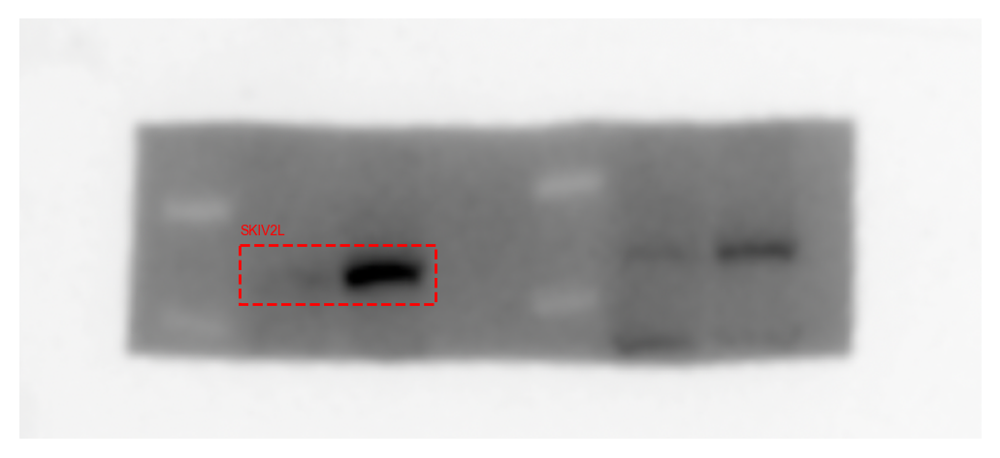

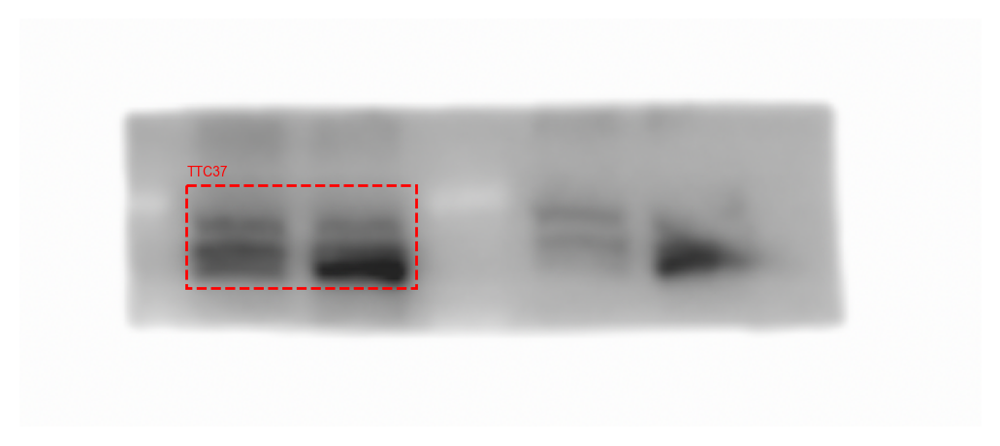

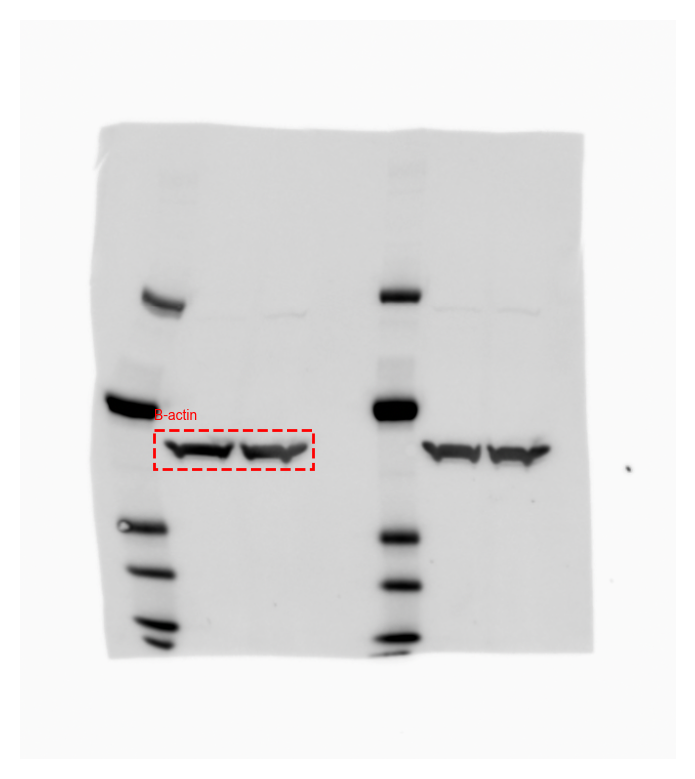

In [22]:
extfig5a_SKIV2L_cropped = crop_and_box_wb(
    IMG_FOLDER+'Extended Figure 5/ExtFig5a_SKIV2L_Kristina.png', {"SKIV2L":[190,240, 185,350]}
)
extfig5a_TTC37_cropped = crop_and_box_wb(
    IMG_FOLDER+'Extended Figure 5/ExtFig5a_TTC37_Kristina.png', {"TTC37":[105,170, 105,250]}
)
extfig5a_B_actin_cropped = crop_and_box_wb(
    IMG_FOLDER+'Extended Figure 5/ExtFig5a_B-actin_Kristina.png', {"B-actin":[420,460, 137,300]}
)

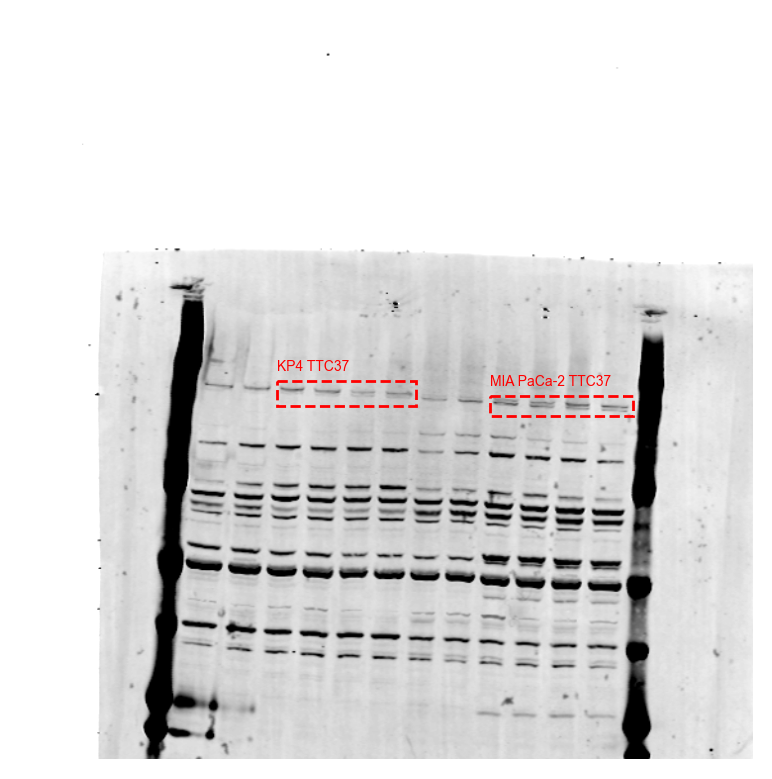

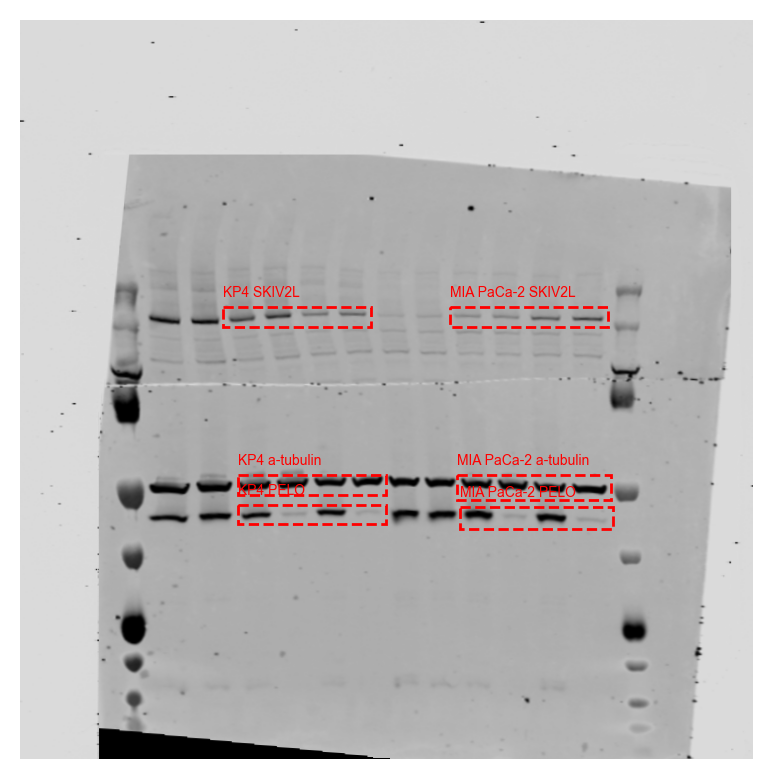

In [23]:
extfig5b_TTC37_cropped = crop_and_box_wb(
    IMG_FOLDER+'Extended Figure 5/ExtFig5ab_TTC37.tif', 
    {"KP4 TTC37":[365,390, 260,400], "MIA PaCa-2 TTC37":[380,400, 475,620]}
)

extfig5b_SKIV2L_PELO_a_tubulin_cropped = crop_and_box_wb(
    IMG_FOLDER+'Extended Figure 5/ExtFig5ab_SKIV2L_PELO_a_tubulin.tif', {
        "KP4 SKIV2L":[290,310, 205,355], 
        "KP4 PELO":[490,510, 220,370], 
        "KP4 a-tubulin":[460,480, 220,370],
        "MIA PaCa-2 SKIV2L":[290,310, 435,595],
        "MIA PaCa-2 PELO":[492,515, 445,600],
        "MIA PaCa-2 a-tubulin":[460,485, 442,598]
    }
)

## Extended Data Panel C: KP4 WB

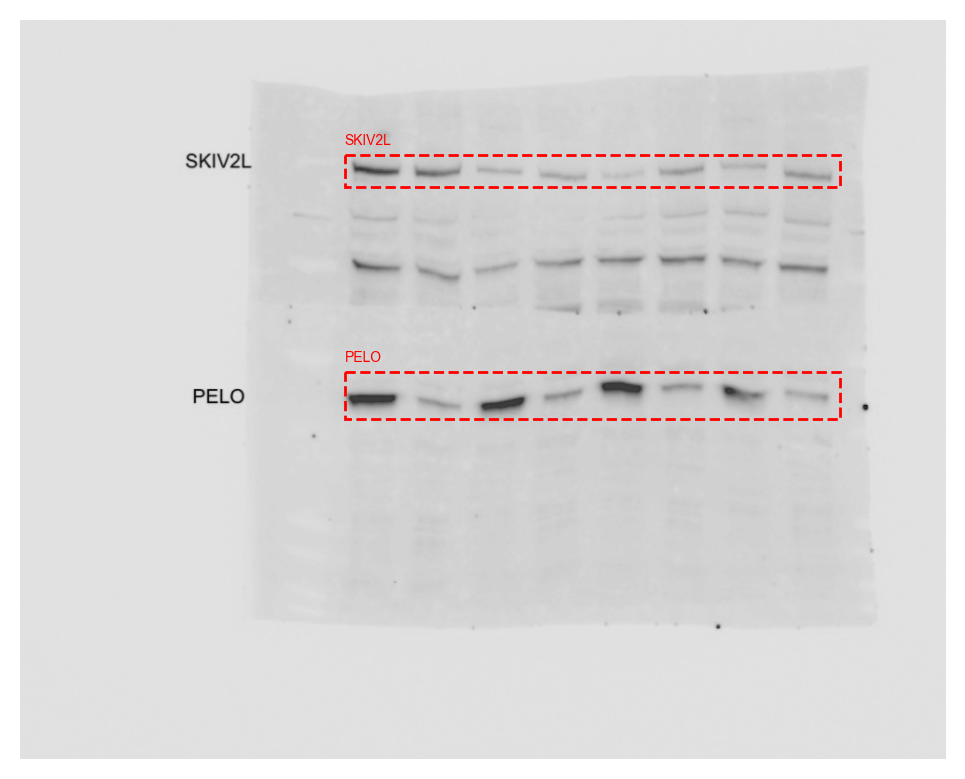

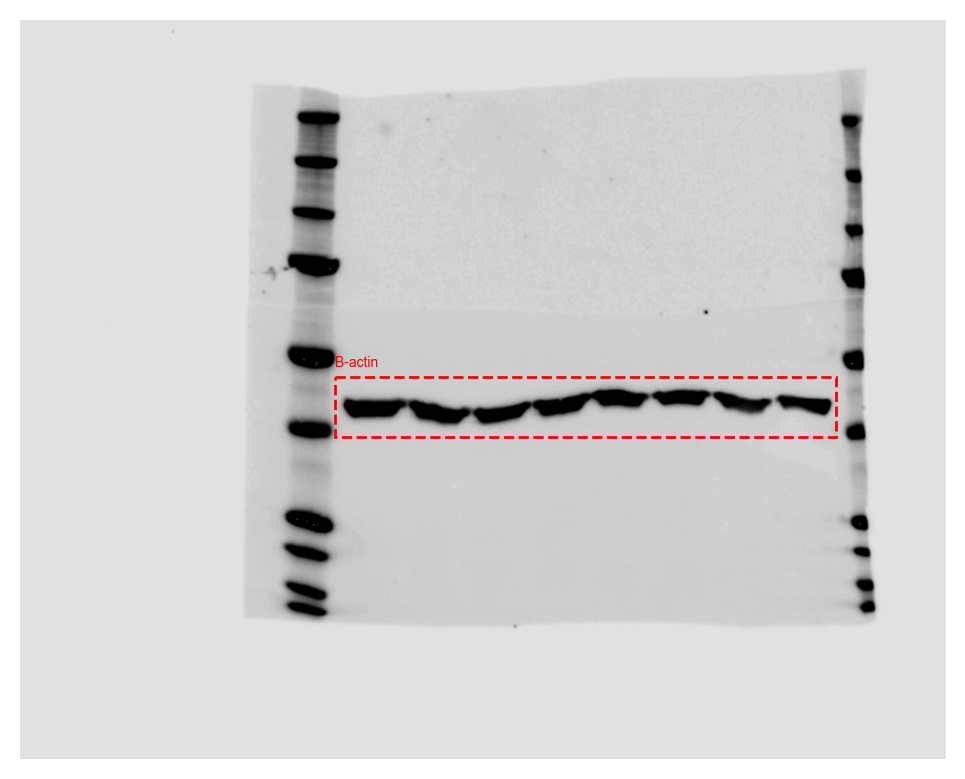

In [24]:
extfig5c_SKIV2L_PELO_cropped = crop_and_box_wb(
    IMG_FOLDER+'Extended Figure 5/ExtFig5c_SKIV2L_PELO.tif', {"SKIV2L":[145,180, 350,885], "PELO":[380,430, 350,885]}
)
extfig5c_b_actin_cropped = crop_and_box_wb(IMG_FOLDER+'Extended Figure 5/ExtFig5c_B_actin.jpg', {"B-actin":[385,450, 340,880]})

## Extended Data Panel D: Min SKIc vs PELO

In [25]:
extfig5d_data = pd.concat({
    "Minimum SKIc Protein Level":ccle_proteomics[["FOCAD", "TTC37", "SKIV2L"]].min(axis=1),
    "PELO Dependency":gene_effect["PELO (53918)"],
    "Biomarkers":biomarker_colors
}, axis=1, join="inner")
extfig5d_data.shape

(302, 3)

## Extended Data Panel E: SKIV2L vs PELO

In [26]:
extfig5e_data = pd.concat({
    "SKIV2L Protein Level":ccle_proteomics["SKIV2L"],
    "PELO Dependency":gene_effect["PELO (53918)"],
    "Biomarkers":biomarker_colors
}, axis=1, join="inner")
extfig5e_data.shape

(302, 3)

## Extended Data Panel F/G: RNAseq

### NOTE: these data are from "Analysis for RNAseq.ipynb"

In [27]:
extfig5f_data = read_in_data("DOXneg_FOCAD_vs_Ch2_KO_deseq2")
extfig5g_data = read_in_data("Ch2_KO_DOXpos_vs_neg_deseq2")

Fetching local copy of DOXneg_FOCAD_vs_Ch2_KO_deseq2
Fetching local copy of Ch2_KO_DOXpos_vs_neg_deseq2


## Extended Data Panel H: WB

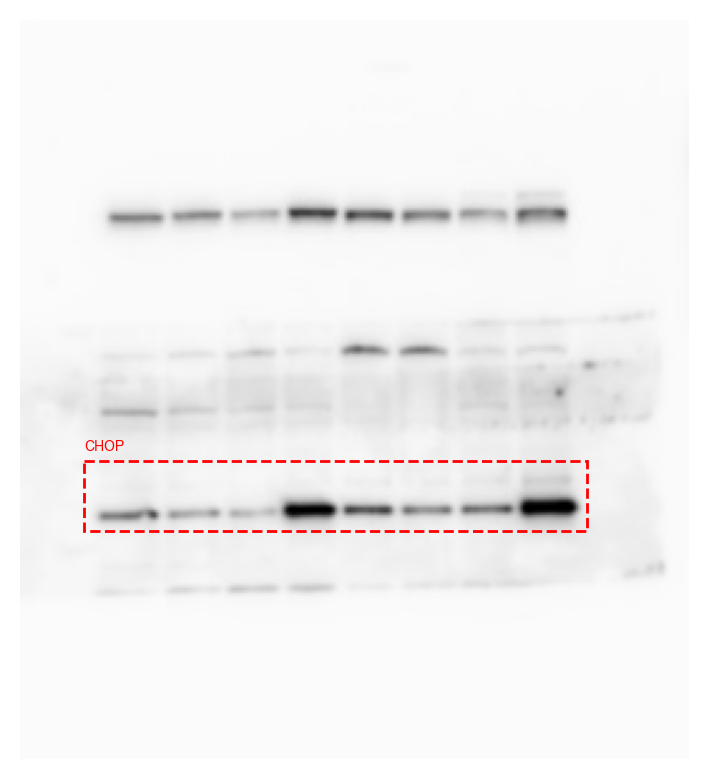

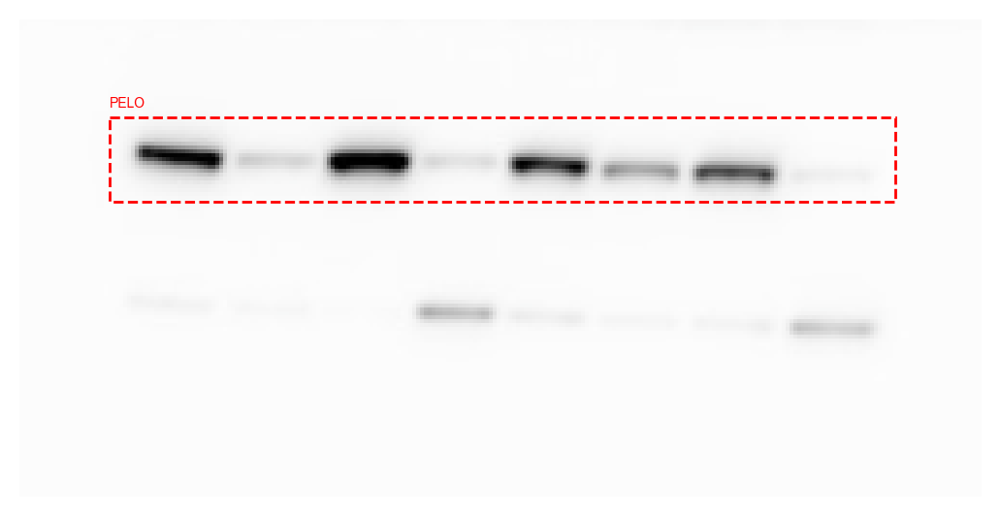

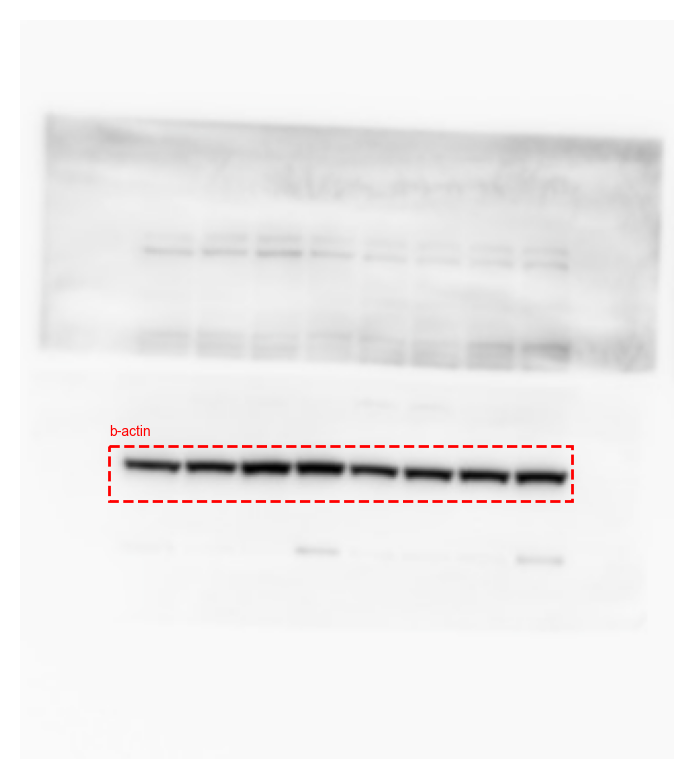

In [28]:
extfig5h_CHOP = crop_and_box_wb(
    IMG_FOLDER+"Extended Figure 5/ExtFig5h_CHOP_IRE.png", {"CHOP":[175,203, 25,225]}
)
extfig5h_PELO = crop_and_box_wb(IMG_FOLDER+"Extended Figure 5/ExtFig5h_PELO.png", {"PELO":[25,47, 23,227]})
extfig5h_b_actin = crop_and_box_wb(IMG_FOLDER+"Extended Figure 5/ExtFig5h_B_actin.png", {"b-actin":[208,235, 43,270]})

## Extended Data Panel I: WB

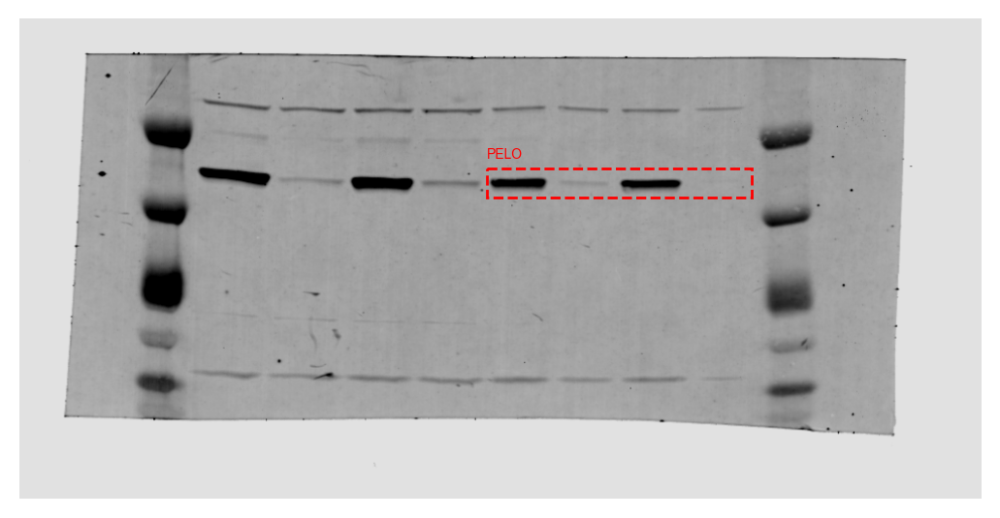

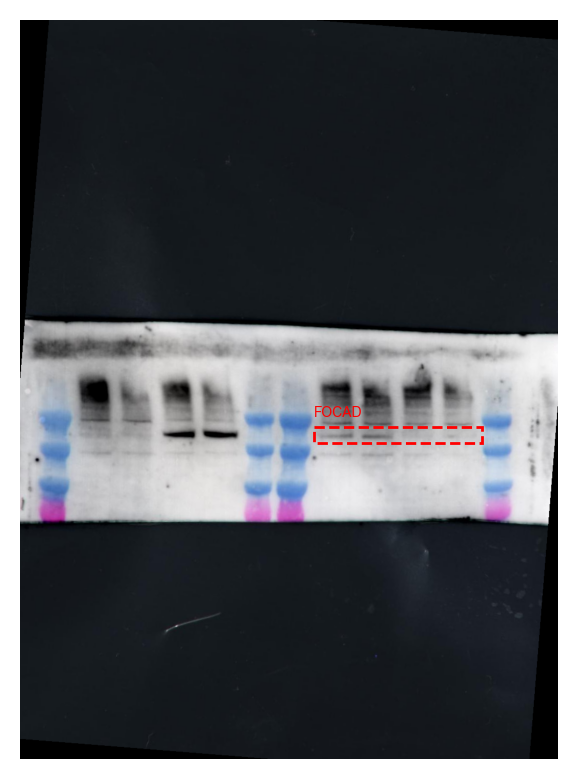

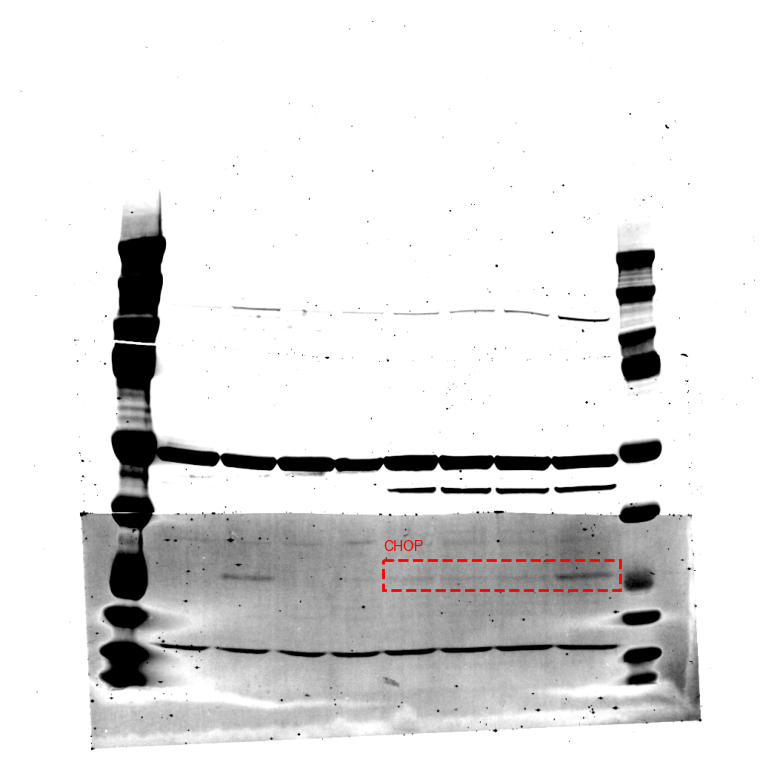

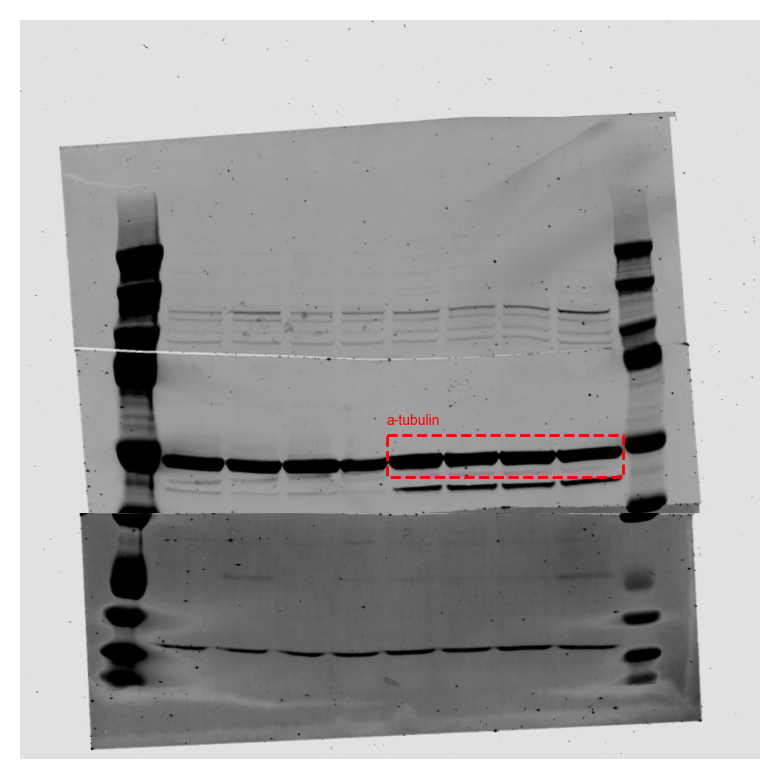

In [29]:
extfig5i_PELO_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4e_PELO.tif', {"PELO":[155,185, 485,760]})
extfig5i_FOCAD_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4e_FOCAD.tif', {"FOCAD":[775,805, 560,880]})
extfig5i_CHOP_cropped = crop_and_box_wb(IMG_FOLDER+'Figure 4/Fig4e_CHOP.tif', {"CHOP":[730,770, 490,810]})
extfig5i_a_tubulin_cropped = crop_and_box_wb(
    IMG_FOLDER+'Figure 4/Fig4e_total_IRE1_a_tubulin.tif', {"a-tubulin":[560,617, 495,815]}
)

## Extended Data Panel J: QPCR sXBP1

In [30]:
extfig5j_data = pd.read_excel(SOURCE_DATA_EXT_FIG, sheet_name="ExtFig5j")

extfig5j_qpcr = pd.DataFrame(
    extfig5j_data.iloc[1:13, :4].values,
    columns=["gRNA", "DOX", 1, 2]
).set_index(["gRNA", "DOX"]).stack().rename_axis(["gRNA", "DOX", "Rep"]).astype(float).to_frame("sXBP1").reset_index()

In [31]:
#test whether FOCAD KO alongside DOX-mediated PELO KD leads to increased sXBP1 expression compared to Ch2 KO
extfig5j_stats = ttest_vs_negcons(
    extfig5j_qpcr.loc[extfig5j_qpcr["DOX"] == "DOX+"], "gRNA", 
    neg_cons=["Ch2"], to_test=["FOCAD#2"], vals="sXBP1", alternative="greater"
).to_frame("DOX+").T
extfig5j_sig = to_scientific(extfig5j_stats.loc["DOX+", "p-val"], prefix="$p$=")
extfig5j_stats

,statistic,p-val,Effect Size,n
DOX+,4.775249,0.000376,0.820757,12.0


# Construct Extended Figure 5

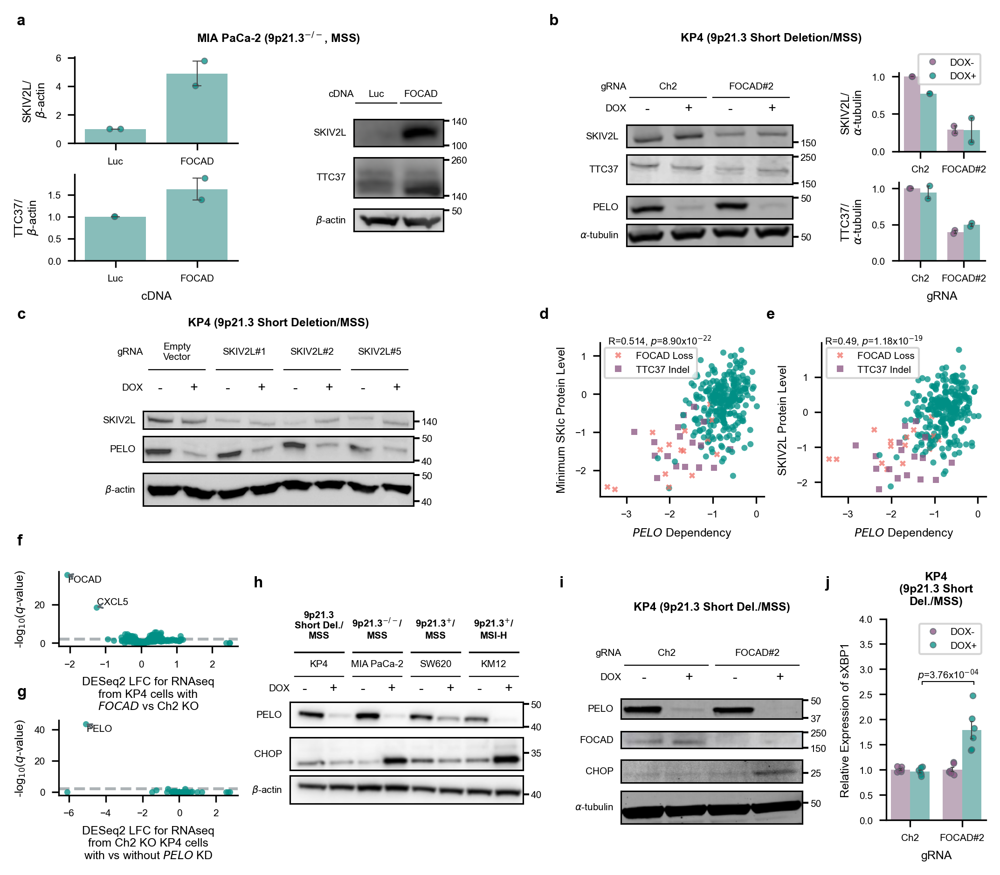

In [32]:
extfig5 = plt.figure(layout="constrained", dpi=300, figsize=(DOUBLE_IN, 6))

gs = extfig5.add_gridspec(nrows=6, ncols=4, width_ratios=[0.5,0.6, 0.6, 0.3], height_ratios=[0.1, 1.2, 0.1, 1, 0.1, 1.4])

Aa = extfig5.add_subplot(gs[0,:2])
Aa.annotate(
    r"MIA PaCa-2 (9p21.3$^{-/-}$, MSS)", (0.5,0.5), 
    horizontalalignment='center', verticalalignment='center', 
    weight="bold", fontsize=6
)
Aa.set_axis_off()
A_ratios = get_wb_height_ratios([
     extfig5a_SKIV2L_cropped['SKIV2L'], extfig5a_TTC37_cropped['TTC37'],
    extfig5a_B_actin_cropped['B-actin'], 
])
As = gs[1, 1].subgridspec(nrows=6, ncols=2, width_ratios=[0.01, 1], height_ratios=[1]+A_ratios+[2])
AL = extfig5.add_subplot(As[1, 1])
add_wb_labels(
    AL, [("cDNA", ["Luc", "FOCAD"]), ("_", ["_", "_"])]
)
A1 = extfig5.add_subplot(As[2, 1])
wb_image(A1, "SKIV2L", extfig5a_SKIV2L_cropped['SKIV2L'], ladder={"140":0.95, "100":0.05})
A2 = extfig5.add_subplot(As[3, 1])
wb_image(A2, "TTC37", extfig5a_TTC37_cropped['TTC37'], ladder={"260":0.95, "140":0.05})
A3 = extfig5.add_subplot(As[4, 1])
wb_image(A3, r"$\beta$-actin", extfig5a_B_actin_cropped['B-actin'], ladder={"50":0.95})
As2 = gs[1, 0].subgridspec(nrows=2, ncols=1)
A5 = extfig5.add_subplot(As2[0])
fancybar(
    data=extfig5a_quant[extfig5a_quant["Protein"] == "SKIV2L"], 
    x="cDNA", y="Ratio", hue="cDNA", dodge=False, ax=A5, s=3, 
    palette=[PELO_GUIDES[1],PELO_GUIDES[1]], order=["Luc", "FOCAD"]
)
A5.set_ylabel(r"SKIV2L/""\n"r"$\beta$-actin")
A5.set_xlabel(None)
A6 = extfig5.add_subplot(As2[1])
fancybar(
    data=extfig5a_quant[extfig5a_quant["Protein"] == "TTC37"], 
    x="cDNA", y="Ratio", hue="cDNA", dodge=False, ax=A6, s=3, 
    palette=[PELO_GUIDES[1],PELO_GUIDES[1]], order=["Luc", "FOCAD"]
)
A6.set_ylabel(r"TTC37/""\n"r"$\beta$-actin")
A6.set_xlabel("cDNA")

Bb = extfig5.add_subplot(gs[0,2:])
Bb.annotate(
    "KP4 (9p21.3 Short Deletion/MSS)", (0.5,0.5), 
    horizontalalignment='center', verticalalignment='center', 
    weight="bold", fontsize=6
)
Bb.set_axis_off()
B_ratios = get_wb_height_ratios([
    extfig5b_SKIV2L_PELO_a_tubulin_cropped['KP4 SKIV2L'], extfig5b_TTC37_cropped['KP4 TTC37'], 
    extfig5b_SKIV2L_PELO_a_tubulin_cropped['KP4 PELO'], extfig5b_SKIV2L_PELO_a_tubulin_cropped['KP4 a-tubulin']
])
Bs = gs[1, 2].subgridspec(nrows=7, ncols=2, width_ratios=[0.1, 1], height_ratios=[1]+B_ratios+[2])
BL = extfig5.add_subplot(Bs[1, 1])
add_wb_labels(
    BL, [("gRNA", ["Ch2", "FOCAD#2"]), ("_", ["_", "_"]), ("DOX", ["-", "+", "-", "+"])]
)
B1 = extfig5.add_subplot(Bs[2, 1])
wb_image(B1, "SKIV2L", extfig5b_SKIV2L_PELO_a_tubulin_cropped['KP4 SKIV2L'], ladder={"150":0.25})
B2 = extfig5.add_subplot(Bs[3, 1])
wb_image(B2, "TTC37", extfig5b_TTC37_cropped['KP4 TTC37'], ladder={"250":0.95, "150":0.05})
B3 = extfig5.add_subplot(Bs[4, 1])
wb_image(B3, "PELO", extfig5b_SKIV2L_PELO_a_tubulin_cropped['KP4 PELO'], ladder={"50":0.955})
B4 = extfig5.add_subplot(Bs[5, 1])
wb_image(B4, r"$\alpha$-tubulin", extfig5b_SKIV2L_PELO_a_tubulin_cropped['KP4 a-tubulin'], ladder={"50":0.45})
Bs2 = gs[1, 3].subgridspec(nrows=2, ncols=1)
B5 = extfig5.add_subplot(Bs2[0])
fancybar(
    data=extfig5b_quant[extfig5b_quant["Protein"] == "SKIV2L"], 
    x="gRNA", y="Ratio", hue="DOX", ax=B5, s=3, 
    palette=[NEG_CON, PELO_GUIDES[1]], hue_order=["DOX-", "DOX+"],
)
B5.legend(title=None, loc="upper right", bbox_to_anchor=(1,1.3))
B5.set_ylabel(r"SKIV2L/""\n"r"$\alpha$-tubulin")
B5.set_xlabel(None)
B6 = extfig5.add_subplot(Bs2[1])
fancybar(
    data=extfig5b_quant[extfig5b_quant["Protein"] == "TTC37"], 
    x="gRNA", y="Ratio", hue="DOX", ax=B6, s=3, 
    palette=[NEG_CON, PELO_GUIDES[1]], hue_order=["DOX-", "DOX+"],
)
B6.legend().remove()
B6.set_ylabel(r"TTC37/""\n"r"$\alpha$-tubulin")
B6.set_xlabel("gRNA")

C = extfig5.add_subplot(gs[2,:2])
C.annotate(
    "KP4 (9p21.3 Short Deletion/MSS)", (0.5,0.25), 
    horizontalalignment='center', verticalalignment='center', 
    weight="bold", fontsize=6
)
C.set_axis_off()
C_ratios = get_wb_height_ratios([
    extfig5c_SKIV2L_PELO_cropped["SKIV2L"], extfig5c_SKIV2L_PELO_cropped['PELO'], extfig5c_b_actin_cropped['B-actin']
])
Cs = gs[3,0:2].subgridspec(nrows=6, ncols=1, height_ratios=[0.25]+C_ratios+[1])
CL = extfig5.add_subplot(Cs[1])
add_wb_labels(
    CL, [("gRNA", ["Empty\nVector", "SKIV2L#1", "SKIV2L#2", "SKIV2L#5"]),
         ("_", ["_", "_", "_", "_"]),
         ("DOX", ["-", "+","-", "+","-", "+","-", "+",])]
)
C1 = extfig5.add_subplot(Cs[2])
wb_image(C1, "SKIV2L", extfig5c_SKIV2L_PELO_cropped['SKIV2L'], ladder={"140":0.45})
C2 = extfig5.add_subplot(Cs[3])
wb_image(C2, "PELO", extfig5c_SKIV2L_PELO_cropped['PELO'], ladder={"50":0.95, "40":0.05})
C3 = extfig5.add_subplot(Cs[4])
wb_image(C3, r"$\beta$-actin", extfig5c_b_actin_cropped['B-actin'], ladder={"50":0.95, "40":0.15})

DEs = gs[3,2:].subgridspec(nrows=1, ncols=2,)
D = extfig5.add_subplot(DEs[0])
quick_scatter(
    extfig5d_data["PELO Dependency"].rename("$PELO$ Dependency"), 
    extfig5d_data["Minimum SKIc Protein Level"],
    hue=extfig5d_data["Biomarkers"], style_hue=True,  markers=biomarker_markers_order,
    hue_order=biomarker_colors_order,
    linewidth=0, alpha=0.75, s=10, ax=D
)
D.text(0.05, 0.99, pearson_str(extfig5d_data["PELO Dependency"], extfig5d_data["Minimum SKIc Protein Level"]), 
       transform=D.transAxes, fontsize=5)
D.legend(loc="upper left")

E = extfig5.add_subplot(DEs[1])
quick_scatter(
    extfig5e_data["PELO Dependency"].rename("$PELO$ Dependency"),
    extfig5e_data["SKIV2L Protein Level"], 
    hue=extfig5e_data["Biomarkers"], style_hue=True, markers=biomarker_markers_order,
    hue_order=biomarker_colors_order,
    s=10, linewidth=0, alpha=0.75, ax=E
)
E.text(0.02, 0.99, pearson_str(extfig5e_data["PELO Dependency"], extfig5e_data["SKIV2L Protein Level"]), transform=E.transAxes)
E.legend(loc="upper left")

FGs = gs[5,0].subgridspec(nrows=2, ncols=1,)
F = extfig5.add_subplot(FGs[0])
quick_scatter(
    x=extfig5f_data["log2FoldChange"], y=extfig5f_data["-log10(padj)"],
    labels=extfig5f_data.loc[extfig5f_data["padj"] < 0.01].nsmallest(2, "padj")["symbol"], 
    hline=-np.log10(0.01), s=10, linewidth=0, alpha=0.75, ax=F
)
F.set_xlabel("DESeq2 LFC for RNAseq\nfrom KP4 cells with\n$FOCAD$ vs Ch2 KO")
F.set_ylabel("-log$_{10}$($q$-value)")


G = extfig5.add_subplot(FGs[1])
ax = quick_scatter(
    x=extfig5g_data["log2FoldChange"], y=extfig5g_data["-log10(padj)"],
    labels=extfig5g_data.loc[extfig5g_data["padj"] < 0.01].nsmallest(1, "padj")["symbol"], 
    hline=-np.log10(0.01), s=10, linewidth=0, alpha=0.75, ax=G
)

G.set_xlabel("DESeq2 LFC for RNAseq\nfrom Ch2 KO KP4 cells\nwith vs without $PELO$ KD")
G.set_ylabel("-log$_{10}$($q$-value)")

H_LABEL = (1.3, 5)
H = extfig5.add_subplot(gs[4,1])
H.set_axis_off()
H_ratios = get_wb_height_ratios([
    extfig5h_PELO["PELO"], extfig5h_CHOP["CHOP"], 
    extfig5h_b_actin["b-actin"]
], H_LABEL)
Hs = gs[5,1].subgridspec(nrows=6, ncols=1, height_ratios=[1]+H_ratios+[2])
HL = extfig5.add_subplot(Hs[1])
add_wb_labels(
    HL, [("", ["KP4", "MIA PaCa-2", "SW620", "KM12"]),
         ("_",["_","_","_","_"]), ("DOX",["-","+","-","+","-","+","-","+",])],
    groups=[("\n9p21.3\nShort Del./\nMSS", (0,0.25)), (r"9p21.3$^{-/-}$/""\nMSS", (0.25,0.5)),
           (r"9p21.3$^{+}$/""\nMSS",(0.5,0.75)), (r"9p21.3$^{+}$/""\nMSI-H", (0.75,1))],
    level_params={"groups":dict(va="bottom",fontsize=5,ha="center"), 
                  "DOX":dict(fontsize=7, ha="center", va="center")},
    size=H_LABEL
)
H1 = extfig5.add_subplot(Hs[2])
wb_image(H1, "PELO", extfig5h_PELO["PELO"], ladder={"50":0.95, "40":0.05})
H2 = extfig5.add_subplot(Hs[3])
wb_image(H2, "CHOP", extfig5h_CHOP["CHOP"], ladder={"35":0.55})
H3 = extfig5.add_subplot(Hs[4])
wb_image(H3, r"$\beta$-actin", extfig5h_b_actin["b-actin"], ladder={"40":0.35})

I_ratios = get_wb_height_ratios([
    extfig5i_PELO_cropped["PELO"], extfig5i_FOCAD_cropped["FOCAD"],
    extfig5i_CHOP_cropped["CHOP"], extfig5i_a_tubulin_cropped["a-tubulin"]
])
Is = gs[5, 2].subgridspec(nrows=7, ncols=2, width_ratios=[0.1,1], height_ratios=[2]+I_ratios+[1])
II = extfig5.add_subplot(Is[0,1])
II.annotate(
    r"KP4 (9p21.3 Short Del./MSS)", (0.5,0.5), 
    horizontalalignment='center', verticalalignment='center', 
    weight="bold", fontsize=6
)
II.set_axis_off()
IL = extfig5.add_subplot(Is[1,1])
add_wb_labels(
    IL, [("gRNA", ["Ch2", "FOCAD#2"]), ("_", ["_", "_"]), ("DOX",["-","+","-","+"])]
)
I1 = extfig5.add_subplot(Is[2,1])
wb_image(I1, "PELO", extfig5i_PELO_cropped["PELO"], ladder={"50":0.95, "37":0.05})
I2 = extfig5.add_subplot(Is[3,1])
wb_image(I2, "FOCAD", extfig5i_FOCAD_cropped["FOCAD"], ladder={"250":0.95, "150":0.05})
I3 = extfig5.add_subplot(Is[4,1])
wb_image(I3, "CHOP", extfig5i_CHOP_cropped["CHOP"], ladder={"25":0.45})
I4 = extfig5.add_subplot(Is[5,1])
wb_image(I4, r"$\alpha$-tubulin", extfig5i_a_tubulin_cropped["a-tubulin"], ladder={"50":0.65})

Js = gs[5,3].subgridspec(nrows=2, ncols=1, height_ratios=[0.1,1])
JJ = extfig5.add_subplot(Js[0])
JJ.annotate(
    "KP4\n(9p21.3 Short\nDel./MSS)", (0.5,0.5), 
    horizontalalignment='center', verticalalignment='center', 
    weight="bold", fontsize=6
)
JJ.set_axis_off()
J1 = extfig5.add_subplot(Js[1])
fancybar(
    data=extfig5j_qpcr,
    x="gRNA", y="sXBP1", hue="DOX", dodge=True,
    hue_order=["DOX-", "DOX+"], 
    order=["Ch2", "FOCAD#2"], s=3, 
    palette=[NEG_CON, PELO_GUIDES[1]], ax=J1
)
J1.set_ylim(0, 4)
add_bracket(J1, extfig5j_sig, [["Ch2", "FOCAD#2"]], 2.75)
J1.set_ylabel("Relative Expression of sXBP1")
J1.legend(title=None)

extfig5.text(0.01, 1, "a", weight='bold', fontsize=8)
extfig5.text(0.55, 1, "b", weight='bold', fontsize=8)
extfig5.text(0.01, 0.65, "c", weight='bold', fontsize=8)
extfig5.text(0.54, 0.65, "d", weight='bold', fontsize=8)
extfig5.text(0.77, 0.65, "e", weight='bold', fontsize=8)
extfig5.text(0.01, 0.38, "f", weight='bold', fontsize=8)
extfig5.text(0.01, 0.2, "g", weight='bold', fontsize=8)
extfig5.text(0.25, 0.33, "h", weight='bold', fontsize=8)
extfig5.text(0.56, 0.33, "i", weight='bold', fontsize=8)
extfig5.text(0.83, 0.33, "j", weight='bold', fontsize=8)

extfig5.set_constrained_layout_pads(
    w_pad=0.05, h_pad = 0.02
)

plt.savefig("figures/ExtFig5.pdf", transparent=True, bbox_inches='tight',)
plt.savefig("figures/ExtFig5.jpg", transparent=True, bbox_inches='tight',)

# Save outputs

In [33]:
fig4a_data.rename_axis("ModelID").to_csv("outputs/Fig4a.csv")
fig4c_data.to_csv("outputs/Fig4c.csv", index=None)
fig4d_enriched.to_csv("outputs/Fig4d.csv", index=None)

In [34]:
extfig4a_data.rename_axis("ModelID").to_csv("outputs/ExtFig4a.csv")
extfig4b_data.rename_axis("ModelID").to_csv("outputs/ExtFig4b.csv")

In [35]:
extfig5d_data.rename_axis("ModelID").to_csv("outputs/ExtFig5d.csv")
extfig5e_data.rename_axis("ModelID").to_csv("outputs/ExtFig5e.csv")
extfig5f_data.to_csv("outputs/ExtFig5f.csv", index=None)
extfig5g_data.to_csv("outputs/ExtFig5g.csv", index=None)